In [2]:
#%load_ext autoreload
#%autoreload 2

import anndata
import matplotlib.pyplot as plt
import seaborn as sns
import logging
import numpy as np
import pandas as pd
import scipy.stats
import scanpy as sc
import sys
import anndata as ann
import scipy as sp
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
from matplotlib.colors import ListedColormap,LinearSegmentedColormap
import logging
import leidenalg
import os
import xarray as xr
from typing import Iterable, Optional
import altair as alt



In [3]:
import batchglm.api as glm
import diffxpy.api as de

print("batchglm version "+glm.__version__)
print("diffpy version "+de.__version__)

batchglm version v0.7.4+5.g31b905b
diffpy version v0.7.4+16.g3689ea8


In [4]:
cmap = LinearSegmentedColormap.from_list("", ['#009ACD','#F9F4EC','#8B0A50'])
#custom_cmap = ListedColormap(['deepskyblue3','#F9F4EC','deeppink4')

In [5]:
sc.settings.set_figure_params(dpi=150, fontsize=14)
sc.settings.verbosity = 3
sc.logging.print_version_and_date()

results_file = '/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis'

Running Scanpy 1.6.0, on 2021-03-09 19:13.


# Define Functions

In [6]:
def custom_color_dict():
    categories = ['High','Mid','Low']
    import matplotlib.colors as pltcolors
    custom_color_dict = {}
    custom_color_dict['High'] = '#8B0A50'
    custom_color_dict['Mid'] = '#F9F4EC'
    custom_color_dict['Low'] ='#009ACD'
    
    return custom_color_dict

In [7]:
custom_color = custom_color_dict()

In [8]:
class Grouped(object):
    """
    Generic grouped object for split-apply-combine style workflows.
    
    Designed to be used with chainable calls.
    """
    def __init__(self, groups: dict):
        self.groups = groups
    
    def __iter__(self):
        for k, v in self.groups.items():
            yield (k, v)

    def apply(self, func):
        """
        Apply func to each value, returning a Grouped result.
        """
        return Grouped({k: func(v) for k, v in self})
    
    def mutate(self, func):
        """
        Apply mutating func to each value.
        
        In contrast with apply, this method assumes passed `func` modifies 
        the values in place, and return the current Grouped.
        """
        for k, v in self:
            func(v)
        return self
    
    def combine(self, func):
        return func(self.groups)
    

def groupby(adata, *, obs=None, var=None):
    is_obs = obs is not None
    is_var = var is not None
    if is_obs == is_var:
        raise ValueError("Can only groupby obs or var")
    if is_obs:
        dim = 0
        grouped = adata.obs.groupby(obs)
        make_idx = lambda x: (x, slice(None))
    elif is_var:
        dim =1
        grouped = adata.var.groupby(var)
        make_idx = lambda x: (slice(None), x)
    return Grouped({k: adata[make_idx(v.index)] for k, v in grouped})

# To get values by leiden
setattr(ann, "groupby", groupby)

In [9]:
def rank_genes_groups_df(
    adata: ann,
    group: str,  # Can this be something other than a str?
    *,
    genes: Optional[Iterable[str]] = None,  # TODO: Implement
    key: str = "rank_genes_groups",
    pval_cutoff: Optional[float] = 0.05,
    logfc_cutoff: Optional[float] = None,
    gene_symbols: Optional[str] = None
) -> pd.DataFrame:
    """
    Get `rank_genes_groups` results in the form of a :class:`pd.DataFrame`.

    Params
    ------
    adata
        Object to get results from.
    group
        Which group (key from :func:`scanpy.tl.rank_genes_groups` `groupby`) to
        return results from.
    genes
        Only return values for these genes.
    key
        Key differential expression groups were stored under.
    pval_cutoff
        Minimum adjusted pval to return.
    logfc_cutoff
        Minumum logfc to return.
    gene_symbols
        Column name in `.var` DataFrame that stores gene symbols. By default `var_names` 
        refer to the index column of the `.var` DataFrame. Setting this option allows
        alternative names to be used.
    """
    d = pd.DataFrame()
    for k in ['scores', 'names', 'logfoldchanges', 'pvals', 'pvals_adj']:
        d[k] = adata.uns["rank_genes_groups"][k][group]
    if pval_cutoff is not None:
        d = d[d["pvals_adj"] < pval_cutoff]
    if logfc_cutoff is not None:
        d = d[d["logfoldchanges"].abs() > logfc_cutoff]
    if gene_symbols is not None:
        d = d.join(adata.var[gene_symbols], on="names")
    return d

In [10]:
def de_dataset(adata, *, grouper=None, key="rank_genes_groups"):
    """
    Versus rest, style de tests returned as an xarray dataset.
    
    Really, this is just to make the "rank_genes_groups" results easier to work with.
    It should also be pretty straight forwards to get this working with diffxpy.
    
    Returns
    -------
    An xarray dataset with `genes`, `groups` as coordinate dimensions.
    """
    keys = ['logfoldchanges', 'pvals', 'pvals_adj', 'scores']
    genes_index = pd.Index(adata.var_names, name="genes")
    # Make sure we've got DE values:
    if grouper:
        sc.tl.rank_genes_groups(adata, groupby=grouper, key_added=key, method="wilcoxon", n_genes=adata.shape[1])
    else:
        grouper = adata.uns["rank_genes_groups"]["params"]["groupby"]
    groups = adata.obs[grouper].cat.categories
    dedfs = {}
    for g in groups:
        dedf = rank_genes_groups_df(adata, g, pval_cutoff=None).set_index("names")
        dedf.index.name = "genes"
        dedfs[g] = dedf
    results = xr.Dataset(coords={"genes": adata.var_names, "group": groups})
    for k in keys:
        df = pd.DataFrame(index=genes_index)
        for g in groups:
            df[g] = dedfs[g][k]
        df.columns.name = "group"
        results[k] = df
    return results

In [11]:
directory = os.getcwd()
directory



'/mnt/ibm_lg/ashleyb/Jupyter_Notebooks/Jupyter_notebooks'

In [12]:
cd /mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/

/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection


In [13]:
ls

All_CellComp_SecondaryBacterial_010621.csv
AnnData_SecondaryBact_Early_011821_MitoRemoved_Annotated_BatchCorrected.h5ad
AnnData_SecondaryBact_Early_011821_MitoRemoved_Annotated_BatchCorrected.h5seurat
AnnData_SecondaryBact_Early_011821_MitoRemoved_Annotated_BatchCorrected.rds
AnnData_SecondaryBact_Early_012721_Control_MitoRemoved_BatchCor_Clustered.h5ad
AnnData_SecondaryBact_Early_012721_Control_MitoRemoved_BatchCor_Clustered.h5seurat
AnnData_SecondaryBact_Early_021621_MitoRemoved_BatchCor_Annotated_1172.h5ad
AnnData_SecondaryBact_Early_110620_MitoRemoved_Annotated_BatchCorrected.h5ad
AnnData_SecondaryBact_Early_110620_MitoRemoved_Annotated.h5ad
AnnData_SecondaryBact_Early_110620_MitoRemoved_Clustered
AnnData_SecondaryBact_Early_111720_MitoRemoved_BatchCor_Annotated.rds
AnnData_SecondaryBact_Early_111720_MitoRemoved_BatchCor_Clustered.h5ad
AnnData_SecondaryBact_Early_111720_MitoRemoved_BatchCor_Clustered.h5seurat
AnnData_SecondaryBact_Early_111820_MitoRemoved_Annotated_BatchCorrected.h

In [14]:
#adata_merge_CD45 = sc.read_h5ad('./AnnData_082720_LogQCNorm_Early_CD45_NoEpCAM.h5ad')
adata_merge_long = sc.read_h5ad('./AnnData_SecondaryBact_Longitudinal_EarlyvsLate_013021_MitoRemoved_BatchCor_Clustered.h5ad')

In [15]:
#adata_merge_CD45 = sc.read_h5ad('./AnnData_082720_LogQCNorm_Early_CD45_NoEpCAM.h5ad')
adata_merge_late = sc.read_h5ad('./AnnData_SecondaryBact_Late_111820_MitoRemoved_Annotated_BatchCorrected.h5ad')

In [16]:
#adata_merge_CD45 = sc.read_h5ad('./AnnData_082720_LogQCNorm_Early_CD45_NoEpCAM.h5ad')
adata_merge_early = sc.read_h5ad('./AnnData_SecondaryBact_Early_011821_MitoRemoved_Annotated_BatchCorrected.h5ad')

In [28]:
adata_control=sc.read_h5ad('./AnnData_SecondaryBact_Early_012721_Control_MitoRemoved_BatchCor_Clustered.h5ad')

In [17]:
adata_merge_late.shape

(22577, 20564)

In [18]:
adata_merge_early.shape

(17702, 20110)

In [19]:
marker_genes_dict = {'B-cell': ['CD79A', 'MS4A1','JCHAIN','MZB1'],
                     'T-cell': ['CD3D','CD3E','LCK',"IL32",'CD2','PTPRCAP'],
                     'T-CD8+': ['CD8A', 'CD8B'],
                     'T-CD4+': ['CD4','GATA3','FOXP3','IL17A','IFNG'],
                     'NK': ['GNLY', 'NKG7','KLRC1'],
                     'Myeloid': ['CST3', 'LYZ'],
                     'Mono/Macro': ['FCGR3A','CD14','CD68','MARCO','C1QA','APOE','APOC1','FCN1','CD163','FABP4','COL6A3'],
                     'Neutrophil':['FCGR3B','CXCR2','PROK2','S100A8','SRGN','NAMPT'],
                     'Dendritic': ['FCER1A','LAMP3','CD1E'],
                     'Epithelial':['KRT18','EPCAM','KRT17'],
                     'Basal':['KRT5','TP63'],                   
                     'Secretory':['SPDEF','CREB3L1','MUC5B','MUC5AC'],
                     'Ciliated':['FOXJ1','SNTN','CDHR3','TPPP3'],
                     
                    }

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


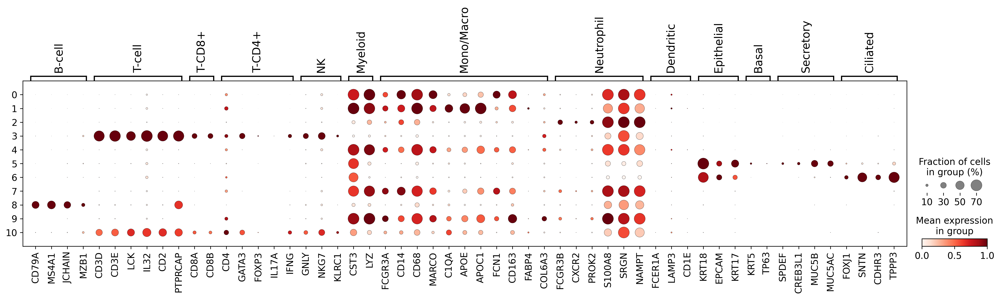

In [20]:
ax = sc.pl.dotplot(adata_merge_early, marker_genes_dict, 
                   groupby='leiden_r0.6',dot_max=0.7, standard_scale='var')

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


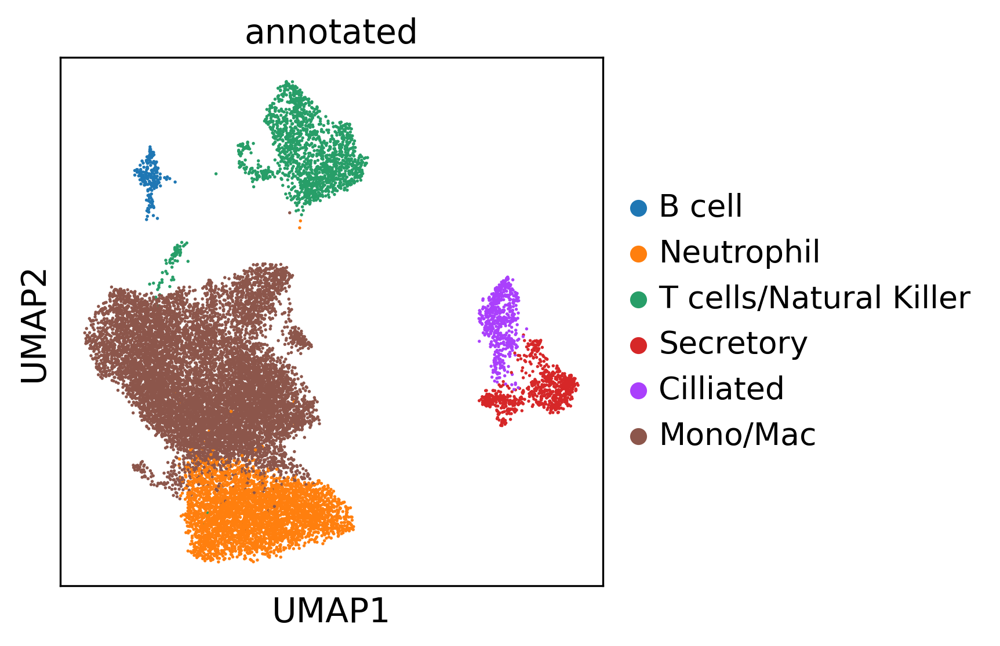

In [21]:
sc.pl.umap(adata_merge_early, color='annotated')

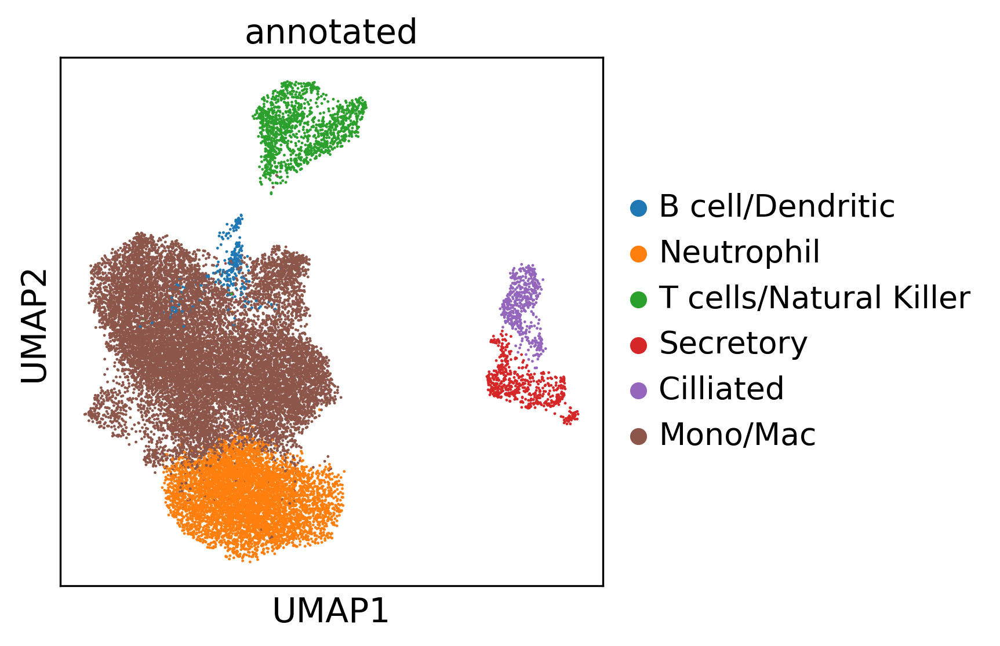

In [22]:
sc.pl.umap(adata_merge_late, color='annotated')

In [23]:
adata_merge_early.uns['annotated_colors']=['#33FFC5','#9cc2b7','#ff0066','#66a3ff','#a6b9e1','#4cb9e1','#445c7a']

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


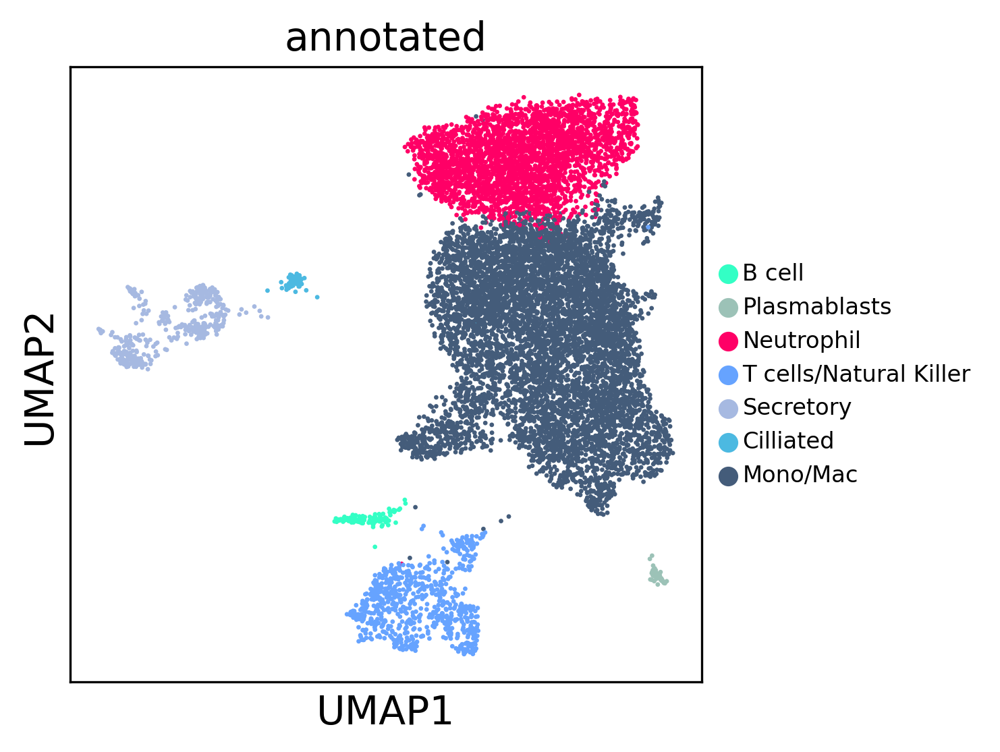

In [22]:
sc.pl.umap(adata_merge_early, color='annotated', legend_fontsize='xx-small', save='Early_noControls_noLegend_020521.pdf')

In [24]:
adata_merge_late.uns['annotated_colors']=['#9cc2b7','#ff0066','#66a3ff','#a6b9e1','#4cb9e1','#445c7a']

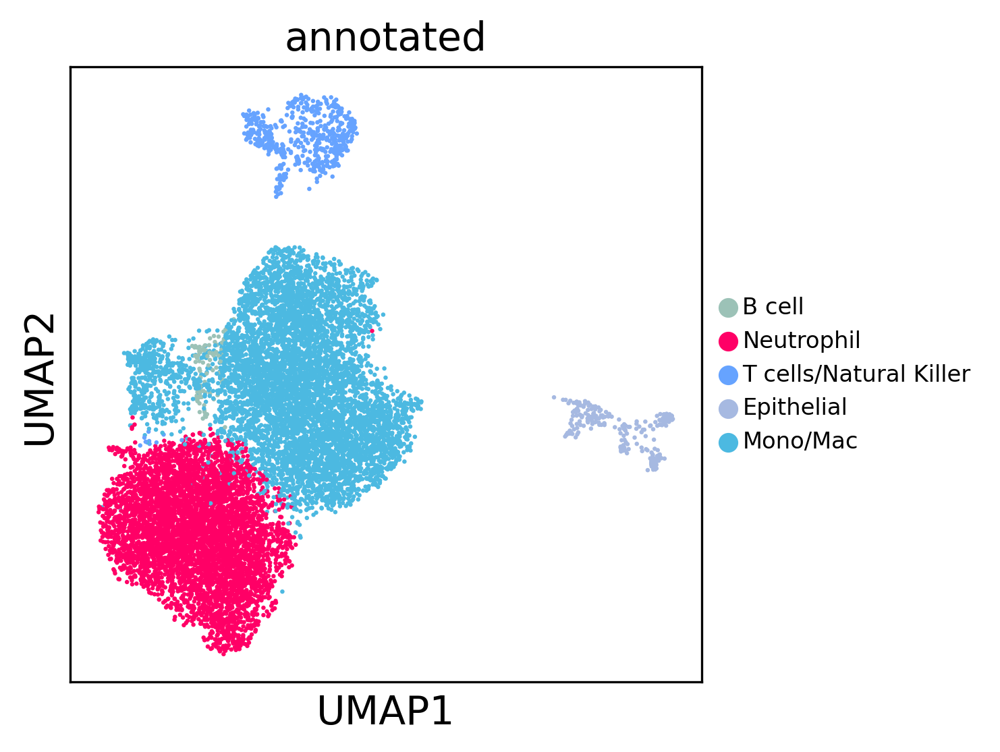

In [25]:
sc.pl.umap(adata_merge_late, color='annotated',legend_fontsize='xx-small',save='Late_noLegend_021321.pdf')

In [24]:
sc.tl.embedding_density(adata_merge_early, groupby='VAP', basis='umap')

computing density on 'umap'
--> added
    'umap_density_VAP', densities (adata.obs)
    'umap_density_VAP_params', parameter (adata.uns)


/home/ashleyb/.local/lib/python3.6/site-packages/scanpy/plotting/_tools/scatterplots.py:400: MatplotlibDeprecationWarning: Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.
  **kwargs,


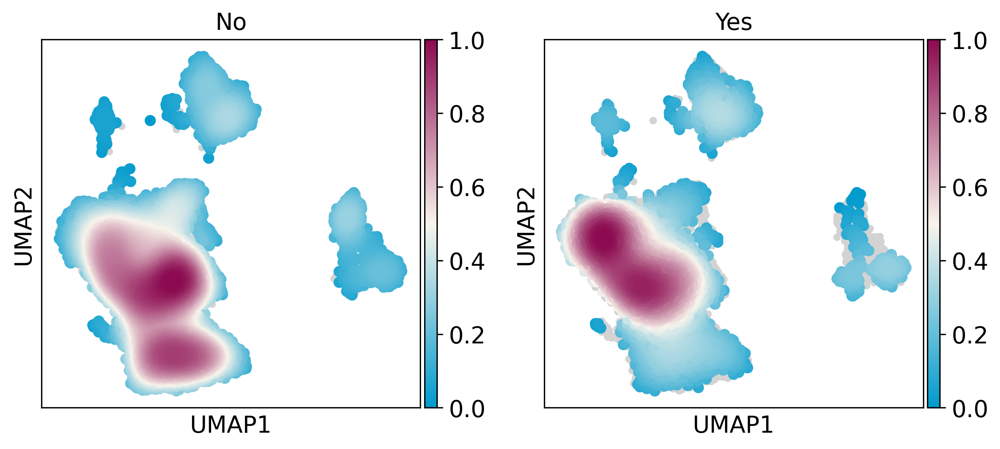

In [25]:
sc.pl.embedding_density(adata_merge_early, key='umap_density_VAP', color_map=cmap)

In [26]:
sc.tl.embedding_density(adata_merge_late, groupby='VAP')

computing density on 'umap'
--> added
    'umap_density_VAP', densities (adata.obs)
    'umap_density_VAP_params', parameter (adata.uns)


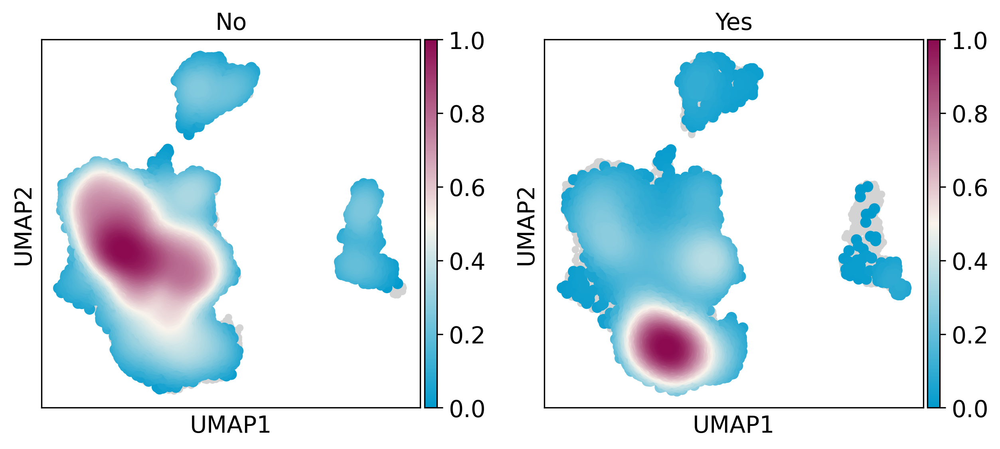

In [27]:
sc.pl.embedding_density(adata_merge_late, key='umap_density_VAP', color_map=cmap)

In [30]:
df_composition_early=adata_merge_early.obs.groupby(['annotated','Identity']).size().to_frame('count')
#df_composition_early['percentage']=df_composition_early['count'].div(df_composition_early.groupby('Identity')['count']
                                                         #.transform('sum'))

In [31]:
df_composition_early

count
annotated Identity                    
B cell    COMET_1047_CD45_Day2       8
          COMET_1154_CD45_Day6      10
          COMET_1158_CD45_Day4       8
          COMET_1161_CD45_Day3      11
          COMET_1172_CD45_Day5       7
...                                ...
Mono/Mac  COMET_1172_CD45_Day5     801
          COMET_1271_CD45_Day12    725
          COMET_1290_CD45_Day7    1161
          COMET_1320_CD45_Day13   1763
          COMET_1357_CD45_Day2     717

[63 rows x 1 columns]

In [32]:
df_composition_early.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/CellComp_Early_SecondaryBacterial_byIdent_022421.csv')

In [91]:
df_composition_long=adata_merge_long.obs.groupby(['annotated','Identity']).size().to_frame('count')
#df_composition_early['percentage']=df_composition_early['count'].div(df_composition_early.groupby('Identity')['count']
                                                         #.transform('sum'))


In [92]:
df_composition_long

count
annotated              Identity                    
B cell                 COMET_1047_CD45_Day2       9
                       COMET_1047_CD45_Day10      1
                       COMET_1154_CD45_Day6      27
                       COMET_1154_CD45_Day13     23
                       COMET_1357_CD45_Day2     180
                       COMET_1357_CD45_Day7       4
Neutrophil             COMET_1047_CD45_Day2     273
                       COMET_1047_CD45_Day10    483
                       COMET_1154_CD45_Day6      50
                       COMET_1154_CD45_Day13     44
                       COMET_1357_CD45_Day2      40
                       COMET_1357_CD45_Day7     583
T cells/Natural Killer COMET_1047_CD45_Day2      68
                       COMET_1047_CD45_Day10     37
                       COMET_1154_CD45_Day6     141
                       COMET_1154_CD45_Day13    204
                       COMET_1357_CD45_Day2      47
                       COMET_1357_CD45_Day7      36
Secretory              COMET_1047_CD45_Day2       3
                       COMET_1047_CD45_Day10      0
                       COMET_1154_CD45_Day6      31
                       COMET_1154_CD45_Day13     17
                       COMET_1357_CD45_Day2     148
                       COMET_1357_CD45_Day7       6
Cilliated              COMET_1047_CD45_Day2       1
                       COMET_1047_CD45_Day10      0
                       COMET_1154_CD45_Day6      11
                       COMET_1154_CD45_Day13      8
                       COMET_1357_CD45_Day2     158
                       COMET_1357_CD45_Day7     106
Mono/Mac               COMET_1047_CD45_Day2     321
                       COMET_1047_CD45_Day10    556
                       COMET_1154_CD45_Day6     956
                       COMET_1154_CD45_Day13    625
                       COMET_1357_CD45_Day2     659
                       COMET_1357_CD45_Day7     852

In [93]:
df_composition_long.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/CellComp_Long_SecondaryBacterial_byIdent.csv')

In [33]:
df_composition_late=adata_merge_late.obs.groupby(['annotated','Identity']).size().to_frame('count')
df_composition_late['percentage']=df_composition_late['count'].div(df_composition_late.groupby('Identity')['count']
                                                         .transform('sum'))

In [34]:
df_composition_late.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/CellComp_LateSecondaryBacterial_byIdent_022421.csv')

# Subset Ann Data Object into Pairwise Control vs VAP and Control vs No VAP

In [14]:
adata_early_control_vap = adata_merge_early[adata_merge_early.obs['VAP'].isin(['Control','Yes'])]

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [15]:
adata_early_control_vap

View of AnnData object with n_obs × n_vars = 10077 × 20847
    obs: 'Identity', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'percent_mito', 'percent_ribo', 'percent_SARS', 'n_genes', 'n_counts', 'VAP', 'leiden', 'leiden_r0.6', 'leiden_r0.5', 'early_VAP_density', 'hightlight', 'annotated'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Identity_colors', 'VAP_colors', 'annotated_colors', "dendrogram_['leiden_r0.6']", 'draw_graph', 'early_VAP_density_params', 'hvg', 'leiden', 'leiden_colors', 'leiden_overRest', 'leiden_r0.6_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_draw_graph_fa', 'X_pca', 'X_pca

In [16]:
set(adata_early_control_vap.obs['Identity'])

{'COMET_1047_CD45_Day2',
 'COMET_1154_CD45_Day6',
 'COMET_1161_CD45_Day3',
 'COMET_1172_CD45_Day5',
 'COMET_1325_CD45_Day0',
 'COMET_1357_CD45_Day2',
 'COMET_1360_CD45_Day0',
 'COMET_1361_CD45_Day0',
 'COMET_1366_CD45_Day0'}

In [17]:
adata_early_control_no = adata_merge_early[adata_merge_early.obs['VAP'].isin(['Control','No'])]

In [18]:
adata_early_control_no

View of AnnData object with n_obs × n_vars = 18735 × 20847
    obs: 'Identity', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'percent_mito', 'percent_ribo', 'percent_SARS', 'n_genes', 'n_counts', 'VAP', 'leiden', 'leiden_r0.6', 'leiden_r0.5', 'early_VAP_density', 'hightlight', 'annotated'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Identity_colors', 'VAP_colors', 'annotated_colors', "dendrogram_['leiden_r0.6']", 'draw_graph', 'early_VAP_density_params', 'hvg', 'leiden', 'leiden_colors', 'leiden_overRest', 'leiden_r0.6_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_draw_graph_fa', 'X_pca', 'X_pca

In [19]:
set(adata_early_control_no.obs['Identity'])

{'COMET_1001_CD45_Day0',
 'COMET_1002_CD45_Day0',
 'COMET_1072_CD45_Day4',
 'COMET_1115_CD45_Day6',
 'COMET_1158_CD45_Day4',
 'COMET_1271_CD45_Day12',
 'COMET_1290_CD45_Day7',
 'COMET_1320_CD45_Day13',
 'COMET_1325_CD45_Day0',
 'COMET_1360_CD45_Day0',
 'COMET_1361_CD45_Day0',
 'COMET_1366_CD45_Day0'}

# Subset Cells by cell type

In [29]:
#Subset to remove the control samples for DE analysis
adata_early_noControl = adata_control[adata_control.obs['VAP'].isin(['No','Yes'])]

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [30]:
adata_early_noControl

View of AnnData object with n_obs × n_vars = 17704 × 20847
    obs: 'Identity', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'percent_mito', 'percent_ribo', 'percent_SARS', 'n_genes', 'n_counts', 'VAP', 'leiden', 'leiden_r0.6', 'leiden_r0.5', 'early_VAP_density'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'Identity_colors', 'VAP_colors', 'draw_graph', 'early_VAP_density_params', 'hvg', 'leiden', 'leiden_colors', 'leiden_r0.6_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_draw_graph_fa', 'X_pca', 'X_pca_harmony', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [32]:
adata_early_noControl_vap_neut = adata_merge_early[adata_merge_early.obs['annotated']=='Neutrophil']
adata_early_noControl_vap_mono = adata_merge_early[adata_merge_early.obs['annotated']=='Mono/Mac']
adata_early_noControl_vap_tcells = adata_merge_early[adata_merge_early.obs['annotated']=='T cells/Natural Killer']

In [21]:
adata_early_control_no_neut = adata_early_control_no[adata_early_control_no.obs['annotated']=='Neutrophil']
adata_early_control_no_mono = adata_early_control_no[adata_early_control_no.obs['annotated']=='Mono/Mac']
adata_early_control_no_tcells = adata_early_control_no[adata_early_control_no.obs['annotated']=='T cells/Natural Killer']

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [12]:
adata_early_neut = adata_merge_early[adata_merge_early.obs['annotated'] == 'Neutrophil']
adata_early_mono = adata_merge_early[adata_merge_early.obs['annotated'] == 'Mono/Mac']
adata_early_tcells = adata_merge_early[adata_merge_early.obs['annotated'] == 'T cells/Natural Killer']

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


In [36]:
adata_late_neut = adata_merge_late[adata_merge_late.obs['annotated'] == 'Neutrophil']
adata_late_mono = adata_merge_late[adata_merge_late.obs['annotated'] == 'Mono/Mac']
adata_late_tcells = adata_merge_late[adata_merge_late.obs['annotated'] == 'T cells/Natural Killer']

In [35]:
adata_long_neut = adata_merge_long[adata_merge_long.obs['annotated']=='Neutrophil']
adata_long_mono = adata_merge_long[adata_merge_long.obs['annotated']=='Mono/Mac']
adata_long_tcells = adata_merge_long[adata_merge_long.obs['annotated']=='T cells/Natural Killer']

In [42]:
adata_early_noControl_vap_tcells.write_h5ad('./AnnData_SecondaryBacterial_Early_022421_tcells.h5ad')

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


In [40]:
adata_early_noControl_vap_mono.write_h5ad('./AnnData_SecondaryBacterial_Early_022421_mono.h5ad')

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


In [41]:
adata_early_noControl_vap_neut.write_h5ad('./AnnData_SecondaryBacterial_Early_022421_neut.h5ad')

In [44]:
adata_late_neut.write_h5ad('./AnnData_SecondaryBacterial_Late_022421_neut.h5ad')

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


In [45]:
adata_late_mono.write_h5ad('./AnnData_SecondaryBacterial_Late_022421_mono.h5ad')

In [46]:
adata_late_tcells.write_h5ad('./AnnData_SecondaryBacterial_Late_022421_tcells.h5ad')

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


# Early VAP Neutrophils DE

# Control vs VAP

In [22]:
#Test for differences across all cell types

test_tt_early_control_vap_neut = de.test.t_test(
    data=adata_early_control_vap_neut,
    grouping="VAP",is_logged=True,is_sig_zerovar =False
    
)

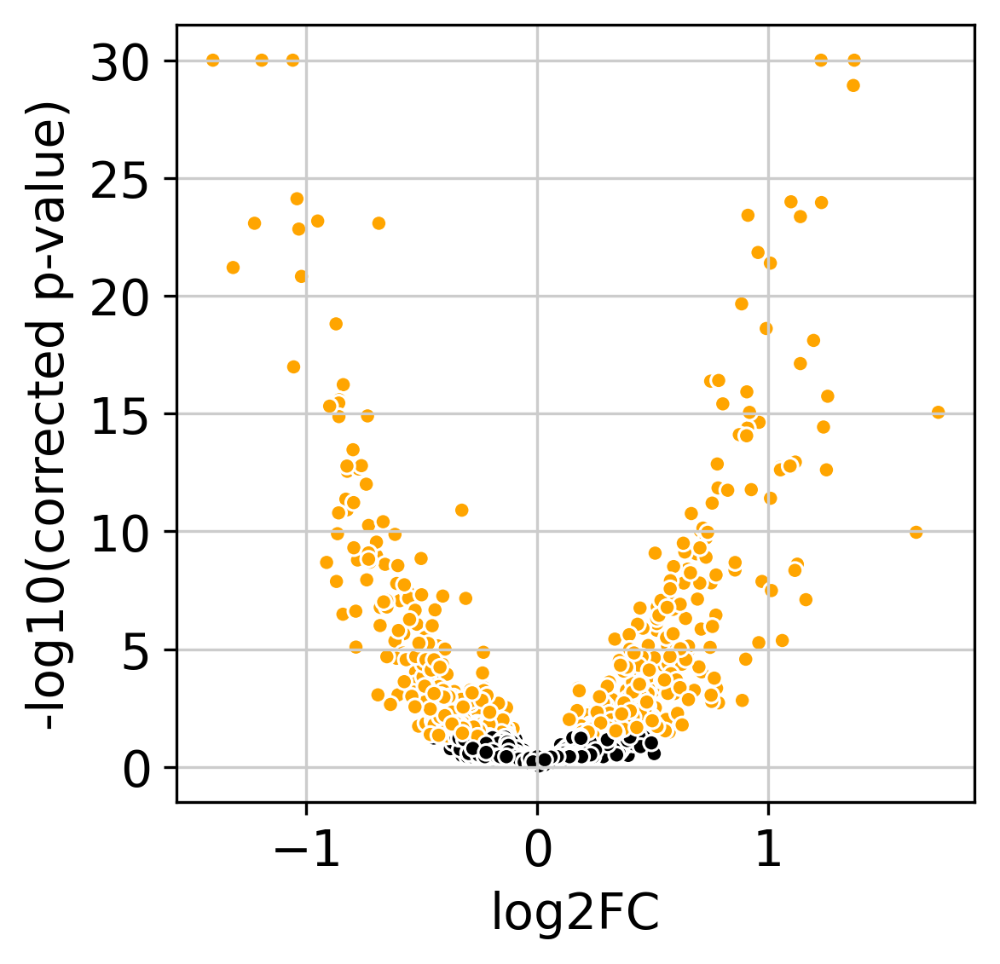

In [23]:
test_tt_early_control_vap_neut.plot_volcano()

In [24]:
data_test_tt_early_control_vap_neut={'gene':test_tt_early_control_vap_neut.gene_ids,'log2FC':test_tt_early_control_vap_neut.log2_fold_change(),'pval':test_tt_early_control_vap_neut.pval,
              'Pval_clean':pow(10,test_tt_early_control_vap_neut.log10_pval_clean()),'qval':test_tt_early_control_vap_neut.qval}

In [25]:
data_test_tt_early_control_vap_neut

{'gene': array(['FAM138A', 'AL627309.1', 'AL627309.2', ..., 'SARS2_ORF8',
        'SARS2_N', 'SARS2_ORF10'], dtype=object),
 'log2FC': array([ 0.02665087,  0.02942447,  0.00441077, ..., -0.01842547,
         0.47391414,  0.03210608]),
 'pval': array([3.33886032e-01, 2.86774286e-01, 9.02069845e-01, ...,
        4.24035091e-01, 2.83847388e-05, 2.46543325e-01]),
 'Pval_clean': array([3.33886032e-01, 2.86774286e-01, 9.02069845e-01, ...,
        4.24035091e-01, 2.83847388e-05, 2.46543325e-01]),
 'qval': array([0.55522373, 0.53570958, 0.94554407, ..., 0.61619771, 0.00177107,
        0.50203033])}

In [26]:
neut_early_control_vap =pd.DataFrame(data=data_test_tt_early_control_vap_neut)
neut_early_control_vap.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/control_vap_neut_early_DE_genes_012821.csv')


In [27]:
#Test for differences across all cell types

test_tt_early_control_vap_mono = de.test.t_test(
    data=adata_early_control_vap_mono,
    grouping="VAP",is_logged=True,is_sig_zerovar =False
    
)

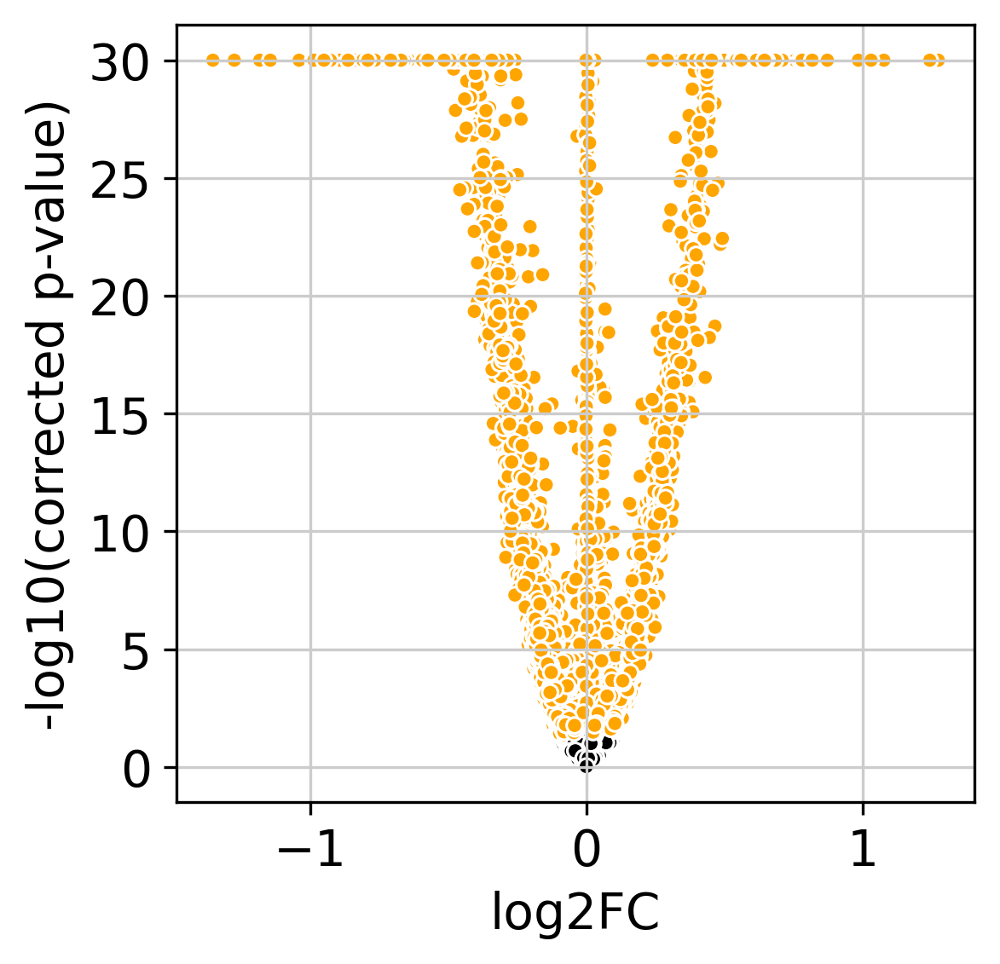

In [28]:
test_tt_early_control_vap_mono.plot_volcano()

In [29]:
data_test_tt_early_control_vap_mono={'gene':test_tt_early_control_vap_mono.gene_ids,'log2FC':test_tt_early_control_vap_mono.log2_fold_change(),'pval':test_tt_early_control_vap_mono.pval,
              'Pval_clean':pow(10,test_tt_early_control_vap_mono.log10_pval_clean()),'qval':test_tt_early_control_vap_mono.qval}

In [30]:
mono_early_control_vap =pd.DataFrame(data=data_test_tt_early_control_vap_mono)
mono_early_control_vap.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/control_vap_mono_early_DE_genes_012821.csv')


In [31]:
#Test for differences across all cell types

test_tt_early_control_vap_tcells = de.test.t_test(
    data=adata_early_control_vap_tcells,
    grouping="VAP",is_logged=True,is_sig_zerovar =False
    
)

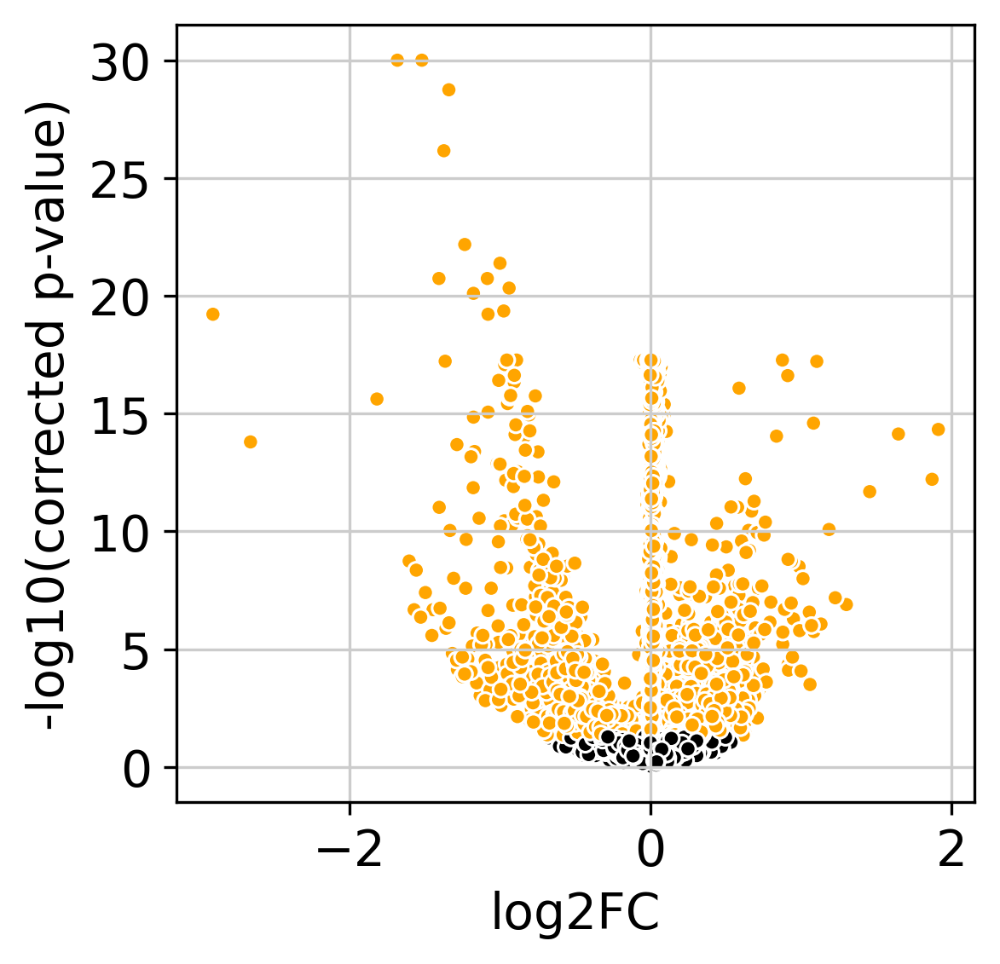

In [32]:
test_tt_early_control_vap_tcells.plot_volcano()

In [33]:
data_test_tt_early_control_vap_tcells={'gene':test_tt_early_control_vap_tcells.gene_ids,'log2FC':test_tt_early_control_vap_tcells.log2_fold_change(),'pval':test_tt_early_control_vap_tcells.pval,
              'Pval_clean':pow(10,test_tt_early_control_vap_tcells.log10_pval_clean()),'qval':test_tt_early_control_vap_tcells.qval}

In [34]:
tcells_early_control_vap =pd.DataFrame(data=data_test_tt_early_control_vap_tcells)
tcells_early_control_vap.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/control_vap_tcells_early_DE_genes_012821.csv')


# Control vs No Vap

In [35]:
#Test for differences across all cell types

test_tt_early_control_no = de.test.t_test(
    data=adata_early_control_no_neut,
    grouping="VAP",is_logged=True,is_sig_zerovar =False
    
)

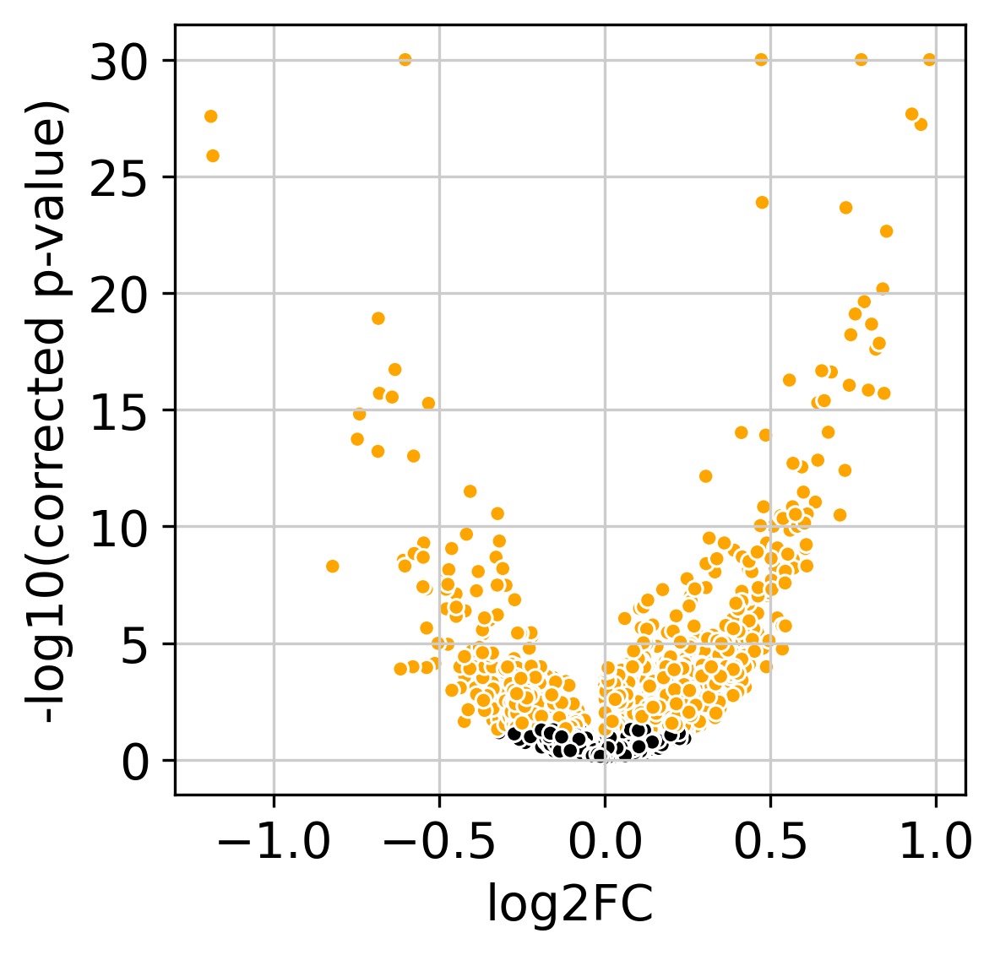

In [36]:
test_tt_early_control_no.plot_volcano()


In [37]:
data_test_tt_early_control_no_neut={'gene':test_tt_early_control_no.gene_ids,'log2FC':test_tt_early_control_no.log2_fold_change(),'pval':test_tt_early_control_no.pval,
              'Pval_clean':pow(10,test_tt_early_control_no.log10_pval_clean()),'qval':test_tt_early_control_no.qval}

In [38]:
neut_early_control_no = pd.DataFrame(data=data_test_tt_early_control_no_neut)
neut_early_control_no.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/control_no_neut_early_DE_genes_012821.csv')


In [39]:
#Test for differences across all cell types

test_tt_early_control_no_mono = de.test.t_test(
    data=adata_early_control_no_mono,
    grouping="VAP",is_logged=True,is_sig_zerovar =False
    
)

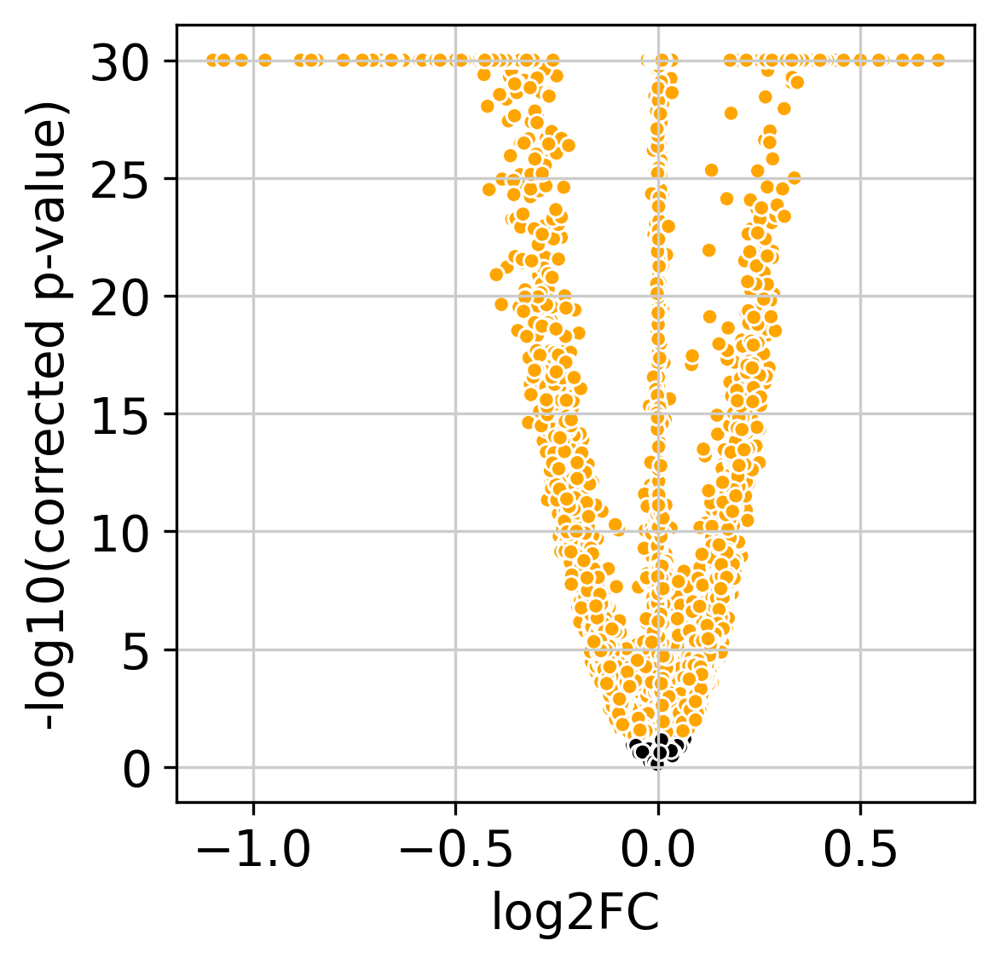

In [40]:
test_tt_early_control_no_mono.plot_volcano()

In [41]:
data_test_tt_early_control_no_mono={'gene':test_tt_early_control_no_mono.gene_ids,'log2FC':test_tt_early_control_no_mono.log2_fold_change(),'pval':test_tt_early_control_no_mono.pval,
              'Pval_clean':pow(10,test_tt_early_control_no_mono.log10_pval_clean()),'qval':test_tt_early_control_no_mono.qval}

In [42]:
mono_early_control_no = pd.DataFrame(data=data_test_tt_early_control_no_mono)
mono_early_control_no.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/control_no_mono_early_DE_genes_012821.csv')


In [43]:
#Test for differences across all cell types

test_tt_early_control_no_tcells = de.test.t_test(
    data=adata_early_control_no_tcells,
    grouping="VAP",is_logged=True,is_sig_zerovar =False
    
)

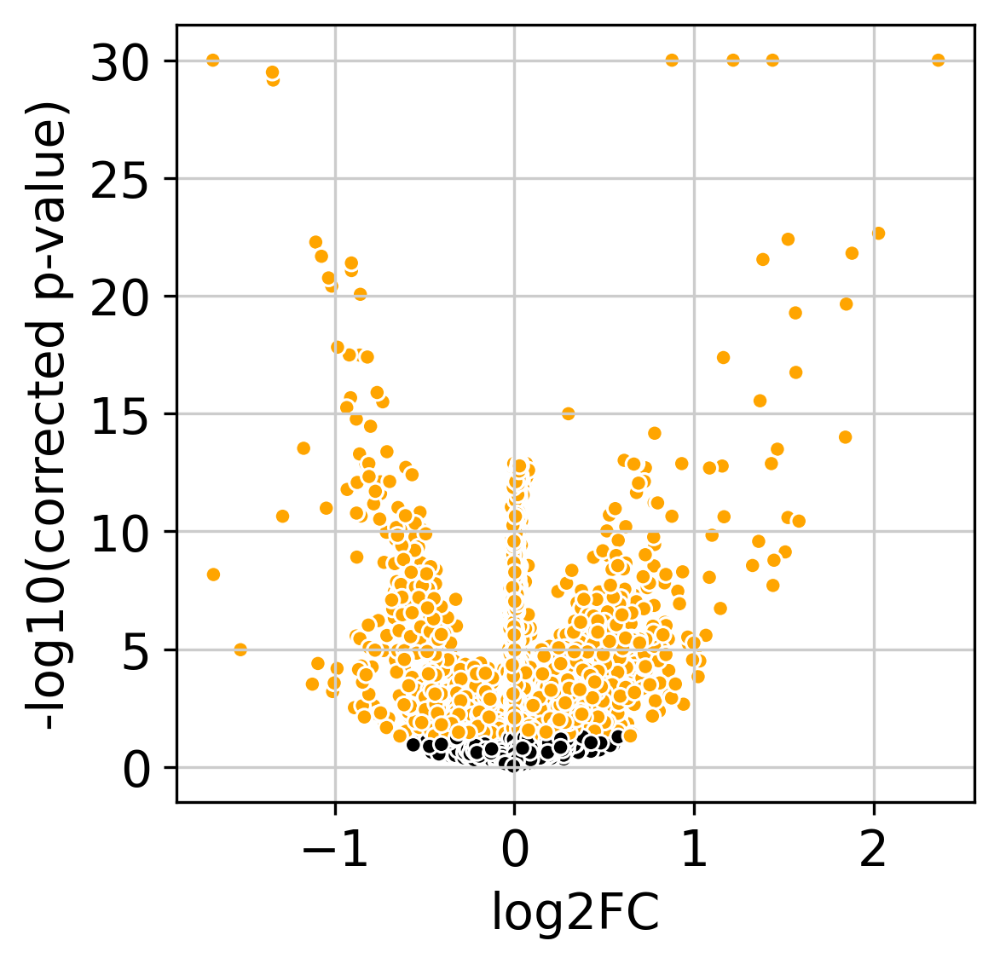

In [44]:
test_tt_early_control_no_tcells.plot_volcano()

In [45]:
data_test_tt_early_control_no_tcells={'gene':test_tt_early_control_no_tcells.gene_ids,'log2FC':test_tt_early_control_no_tcells.log2_fold_change(),'pval':test_tt_early_control_no_tcells.pval,
              'Pval_clean':pow(10,test_tt_early_control_no_tcells.log10_pval_clean()),'qval':test_tt_early_control_no_tcells.qval}

In [46]:
tcells_early_control_no = pd.DataFrame(data=data_test_tt_early_control_no_tcells)
tcells_early_control_no.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/control_no_tcells_early_DE_genes_012821.csv')


# Early VAP vs No VAP

In [47]:
import bioinfokit

In [48]:
bioinfokit.__version__

'1.0.7'

In [50]:
#Test for differences across all cell types

test_tt_early_neut = de.test.t_test(
    data=adata_early_noControl_vap_neut,
    grouping="VAP",is_logged=True,is_sig_zerovar =False
    
)

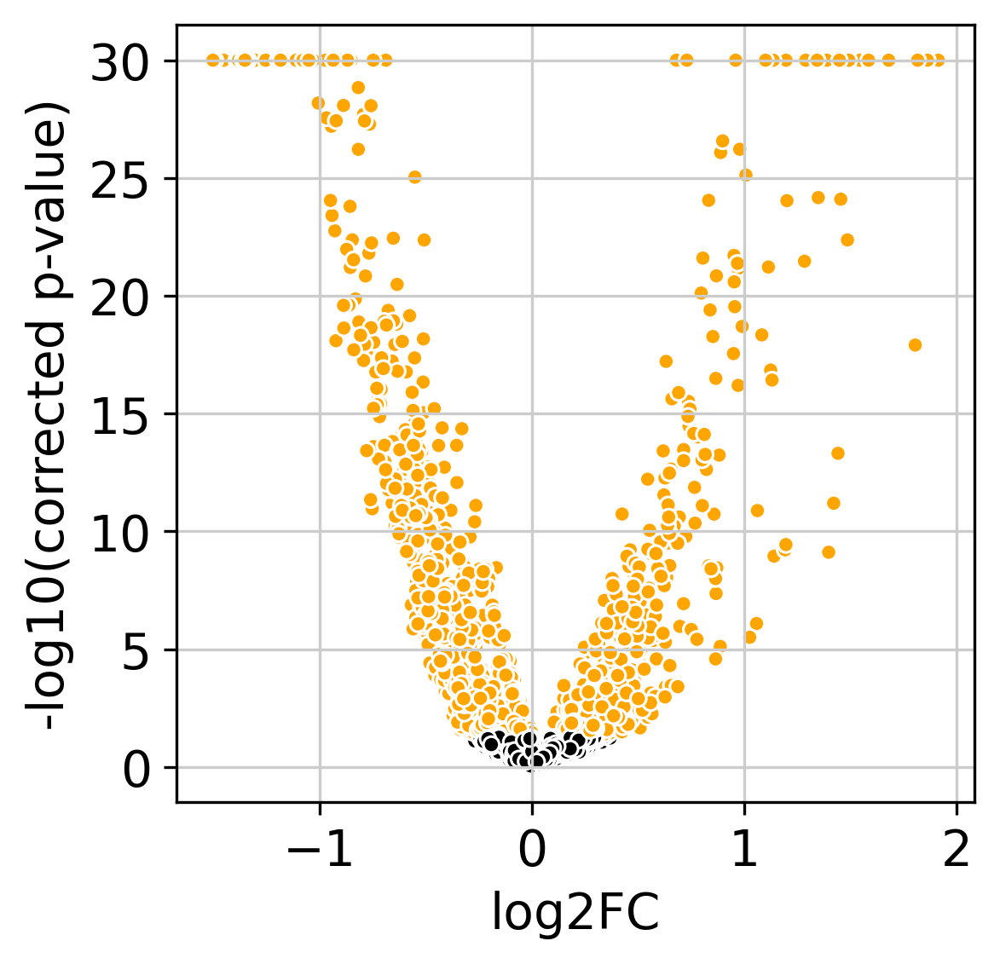

In [51]:
test_tt_early_neut.plot_volcano(save='Neutrophil_Early_Diffxpy')

In [52]:
data_test_tt_early_neut={'gene':test_tt_early_neut.gene_ids,'log2FC':test_tt_early_neut.log2_fold_change(),'pval':test_tt_early_neut.pval,
              'Pval_clean':pow(10,test_tt_early_neut.log10_pval_clean()),'qval':test_tt_early_neut.qval}

In [53]:
data_test_tt_early_neut

{'gene': array(['FAM138A', 'AL627309.1', 'AL627309.2', ..., 'SARS2_ORF8',
        'SARS2_N', 'SARS2_ORF10'], dtype=object),
 'log2FC': array([ 0.03178731,  0.03146706,  0.0063089 , ..., -0.00932146,
         0.50131976,  0.02255571]),
 'pval': array([2.97499470e-01, 3.02021531e-01, 8.46940695e-01, ...,
        1.11324563e-02, 6.37412024e-05, 4.60840609e-01]),
 'Pval_clean': array([2.97499470e-01, 3.02021531e-01, 8.46940695e-01, ...,
        1.11324563e-02, 6.37412024e-05, 4.60840609e-01]),
 'qval': array([0.48024296, 0.48418469, 0.90035618, ..., 0.06360006, 0.00126984,
        0.60761088])}

In [54]:
neut_early_DE =pd.DataFrame(data=data_test_tt_early_neut)


In [55]:
neut_early_DE

,gene,log2FC,pval,Pval_clean,qval
0,FAM138A,0.031787,0.297499,0.297499,0.480243
1,AL627309.1,0.031467,0.302022,0.302022,0.484185
2,AL627309.2,0.006309,0.846941,0.846941,0.900356
3,AL669831.5,-0.008916,0.142359,0.142359,0.303843
4,FAM87B,0.000224,0.573448,0.573448,0.697633
...,...,...,...,...,...
18853,SARS2_ORF6,-0.000407,0.088102,0.088102,0.222730
18854,SARS2_ORF7A,0.053970,0.210749,0.210749,0.388228
18855,SARS2_ORF8,-0.009321,0.011132,0.011132,0.063600
18856,SARS2_N,0.501320,0.000064,0.000064,0.001270


In [56]:
neut_early_DE.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/neut_vap_early_DE_genes_022421.csv')


In [57]:
from bioinfokit import analys, visuz

findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


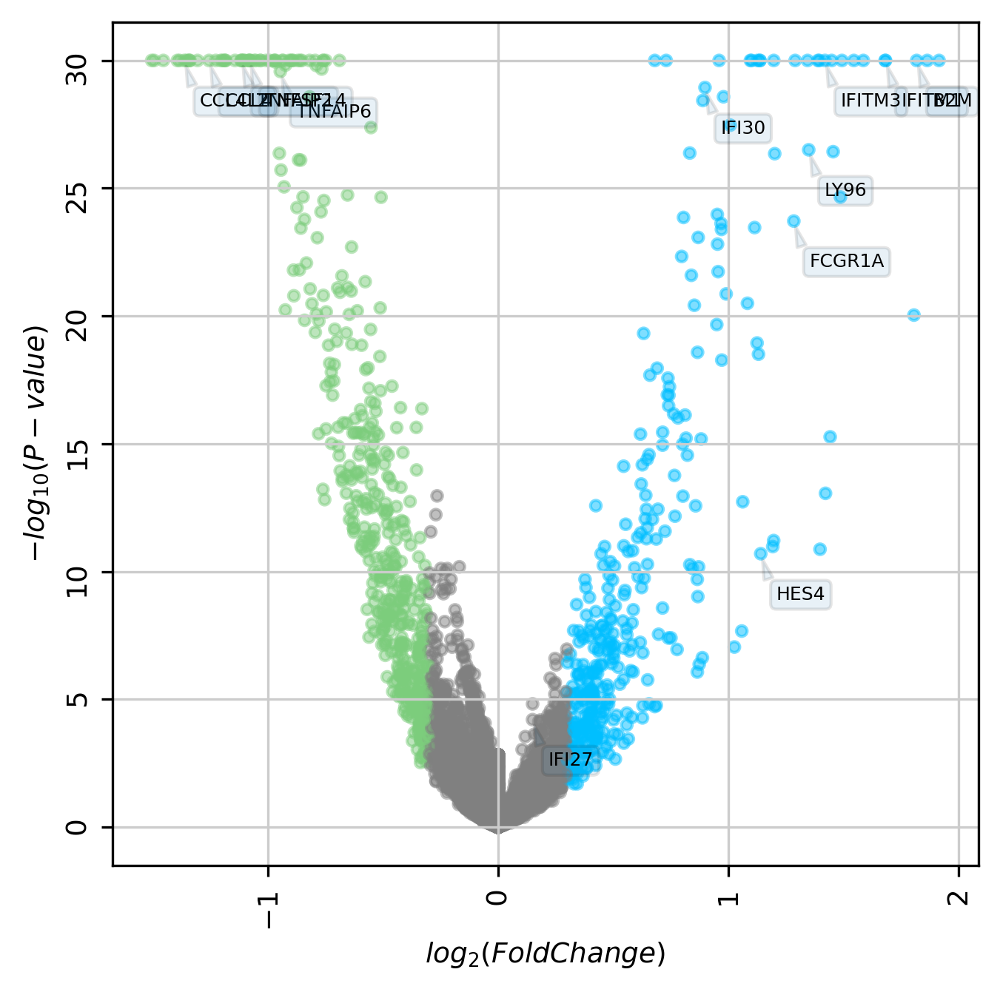

In [58]:
visuz.gene_exp.volcano(df=neut_early_DE, lfc='log2FC', pv='Pval_clean',lfc_thr=(0.3,0.3), color=('#00BFFF','grey','#7CCD7C'),valpha=0.5, dotsize=12, geneid='gene',genenames=('B2M','IFITM1','LY96','IFI27','IFITM3','IFI30','FCGR1A','HES4','CCL4','CCL4L2','TNFAIP2','TNFSF14','TNFAIP6'), gstyle=2,show=True)

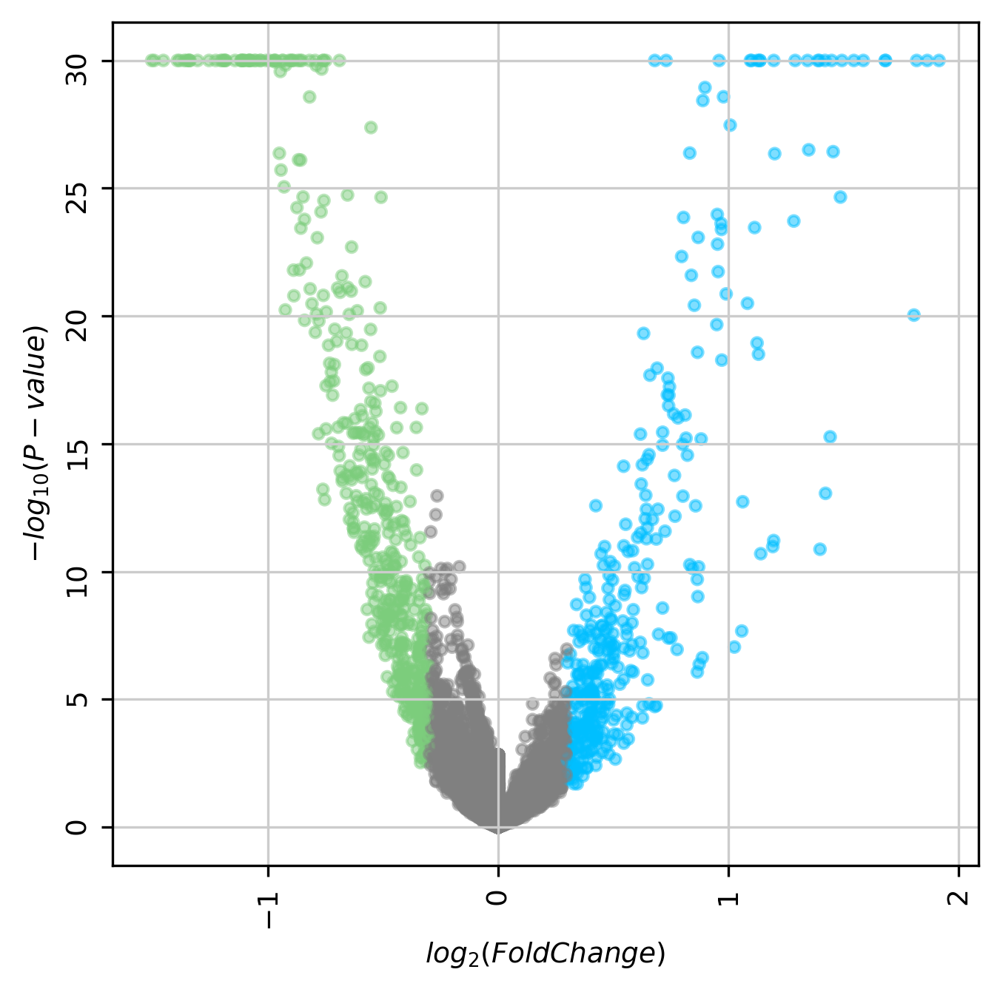

In [59]:
visuz.gene_exp.volcano(df=neut_early_DE, lfc='log2FC', pv='Pval_clean',lfc_thr=(0.3,0.3), color=('#00BFFF','grey','#7CCD7C'),valpha=0.5, dotsize=12, gstyle=2,show=True,figname='Neut_Early_022421_volcano', figtype='pdf')

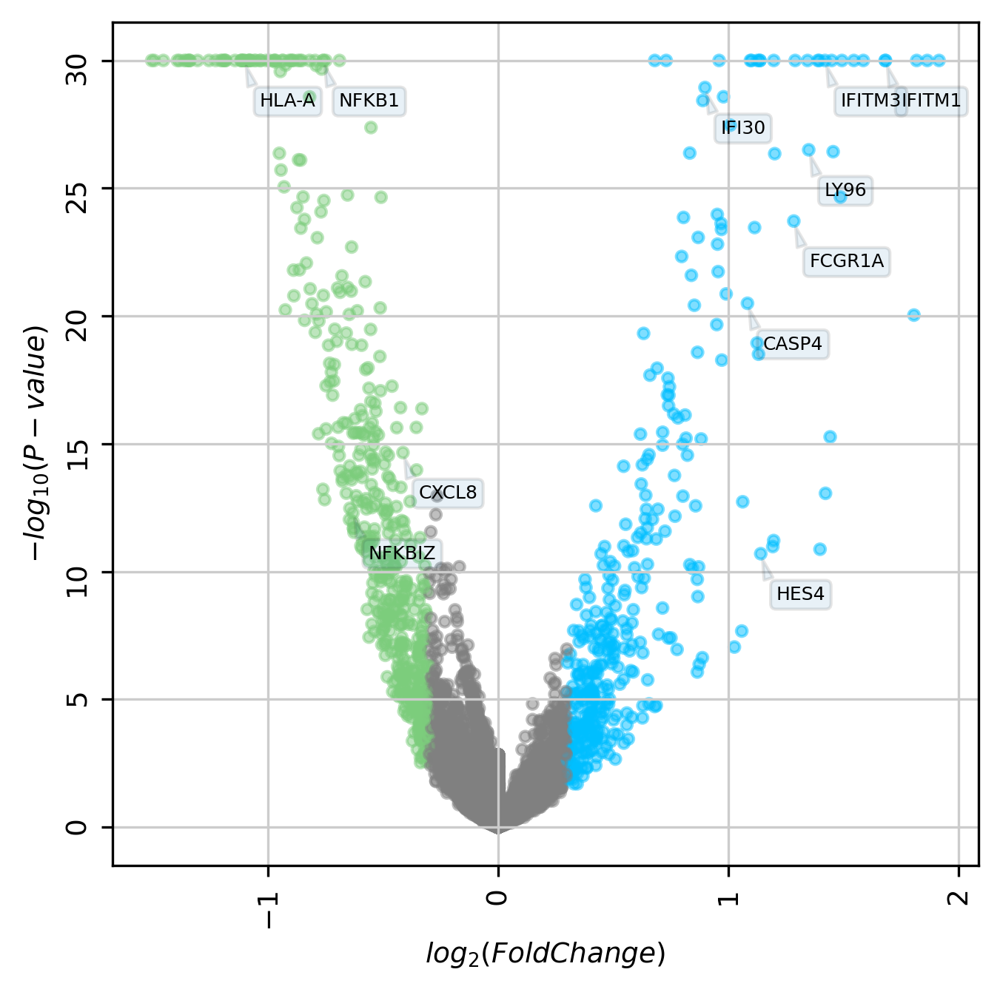

In [82]:
visuz.gene_exp.volcano(df=neut_early_DE, lfc='log2FC', pv='Pval_clean',lfc_thr=(0.3,0.3), color=('#00BFFF','grey','#7CCD7C'),valpha=0.5, dotsize=12, geneid='gene',genenames=('IFITM1','LY96','CASP4','IFITM3','IFI30','FCGR1A','HES4','HLA-A','NFKB1','NFKBIZ','CXCL8'), gstyle=2,show=True)

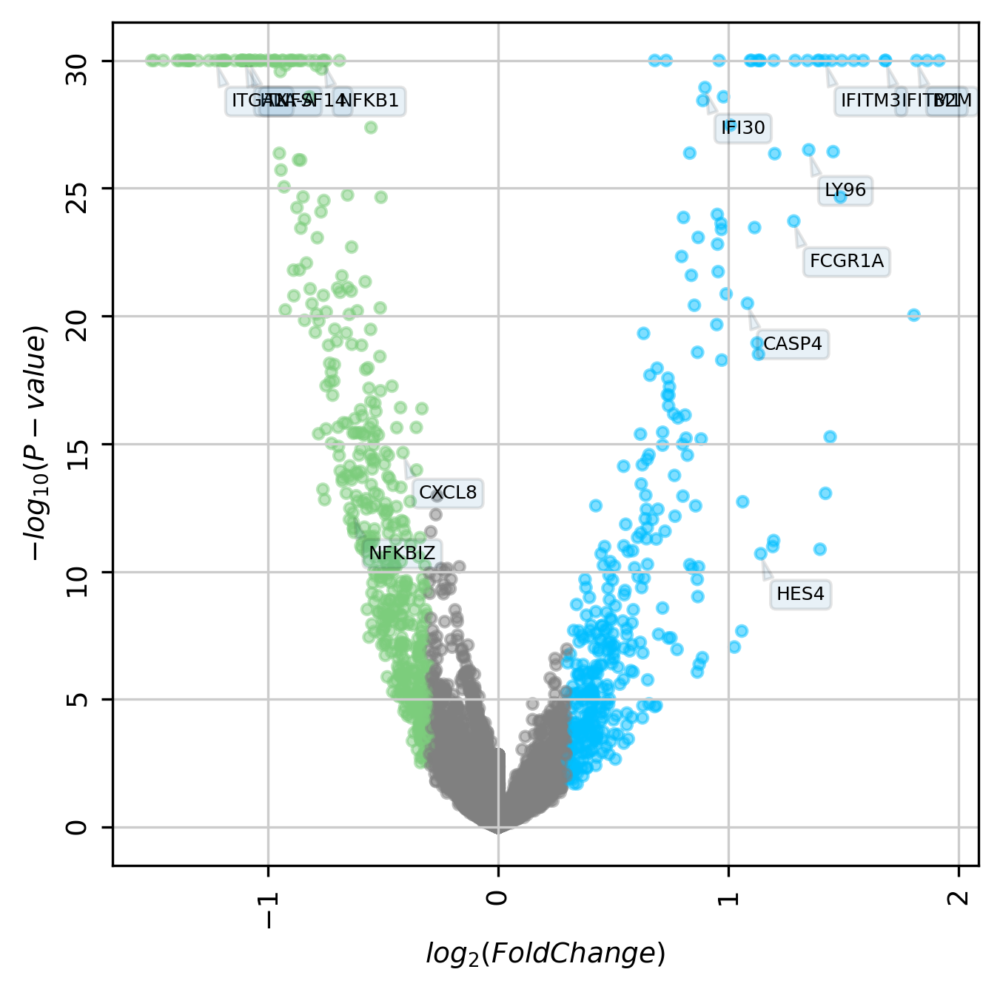

In [60]:
visuz.gene_exp.volcano(df=neut_early_DE, lfc='log2FC', pv='Pval_clean',lfc_thr=(0.3,0.3), color=('#00BFFF','grey','#7CCD7C'),valpha=0.5, dotsize=12, geneid='gene',genenames=('B2M','IFITM1','LY96','CASP4','IFITM3','IFI30','FCGR1A','HES4','ITGAX','TNFSF14','HLA-A','NFKB1','NFKBIZ','CXCL8'), gstyle=2,show=True)

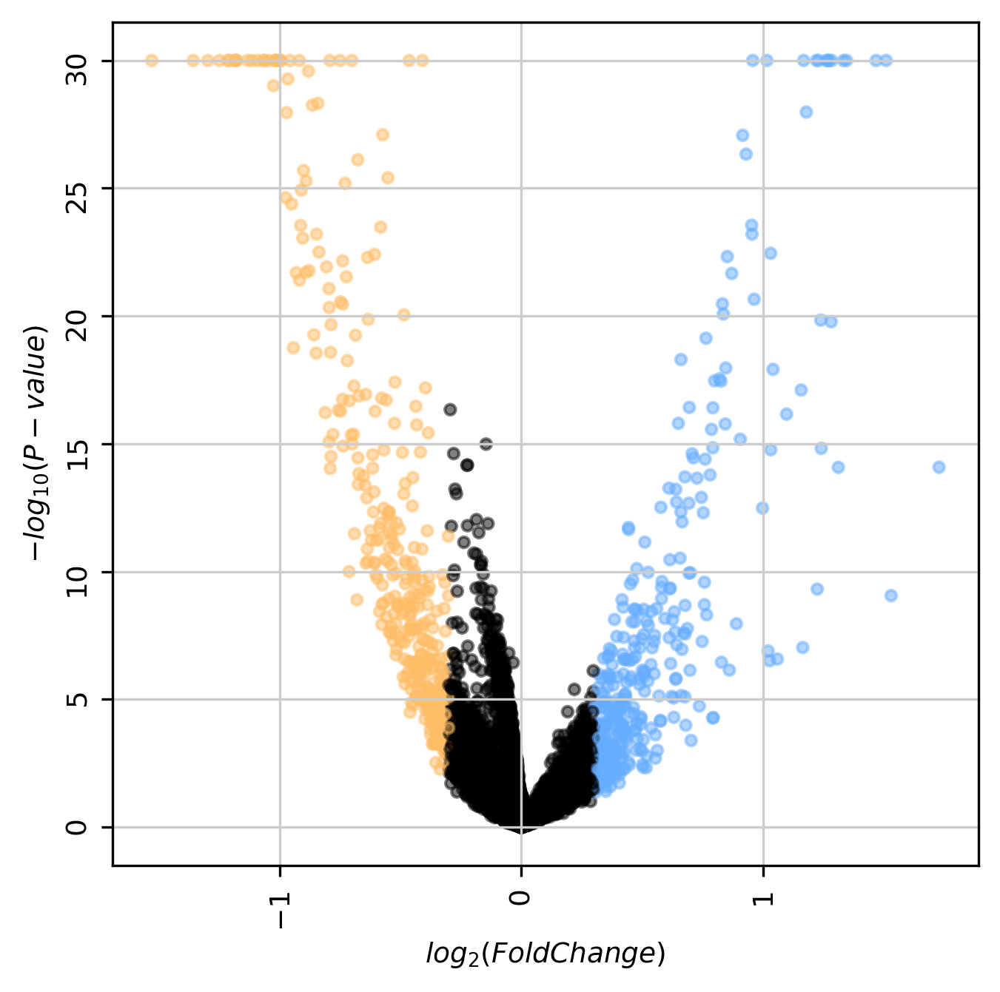

In [99]:
visuz.gene_exp.volcano(df=neut_early_DE, lfc='log2FC', pv='Pval_clean',lfc_thr=(0.3,0.3), color=('#66adff','black','#ffbd66'),valpha=0.5, dotsize=12, geneid='gene',genenames=('APOE','C1QB','C1QC','CAPG','CFD','IL6R','CXCL8','CD83'), gstyle=2, show=True)

In [29]:
neut_early_DE.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/neut_early_DE_genes_022421.csv')

# Late VAP Neutrophils DE

In [48]:
#Test for differences across all cell types

test_tt_late_neut = de.test.t_test(
    data=adata_late_neut,
    grouping="VAP",is_logged=True,is_sig_zerovar =False
    
)

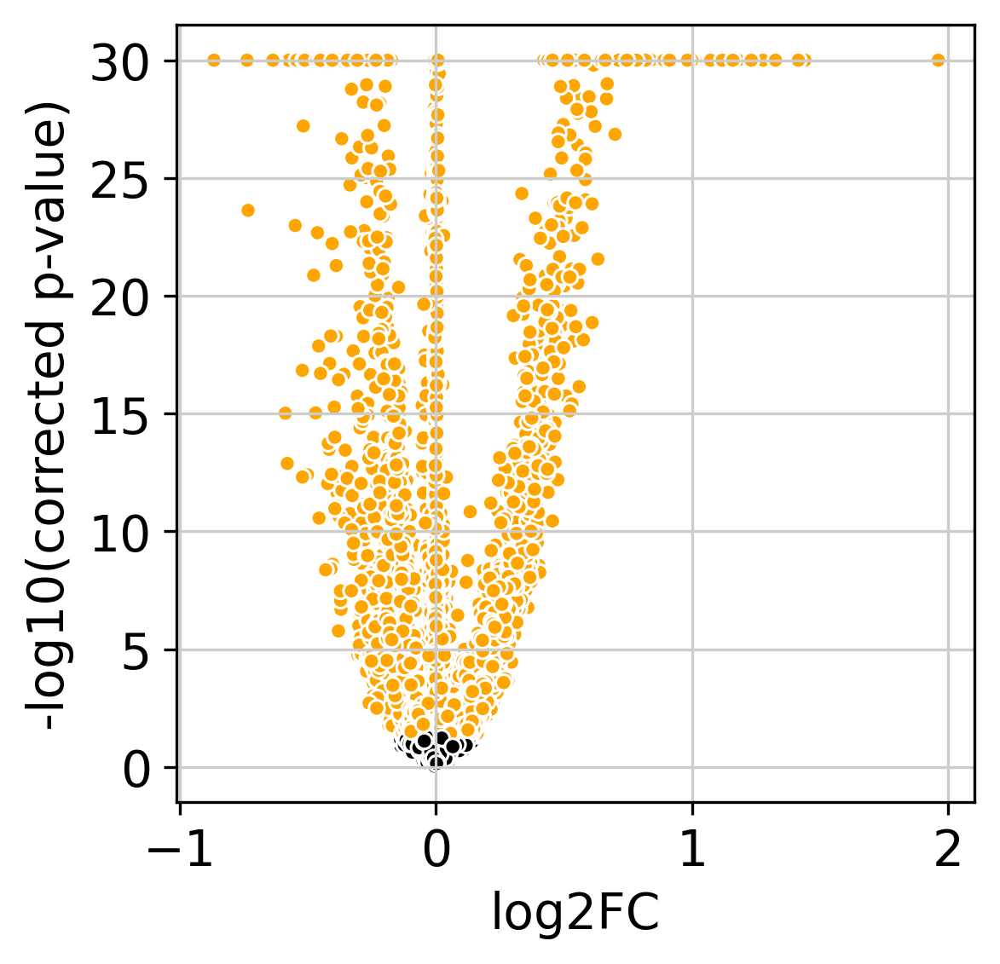

In [49]:
test_tt_late_neut.plot_volcano()

In [50]:
data_test_tt_late_neut={'gene':test_tt_late_neut.gene_ids,'log2FC':test_tt_late_neut.log2_fold_change(),'pval':test_tt_late_neut.pval,
              'Pval_clean':pow(10,test_tt_late_neut.log10_pval_clean()),'qval':test_tt_late_neut.qval}

In [52]:
neut_late_DE = pd.DataFrame(data=data_test_tt_late_neut)
neut_late_DE.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/neut_late_DE_genes_122220.csv')

# Early VAP Mono/Mac DE

In [62]:
#Test for differences across all cell types

test_tt_early_mono = de.test.t_test(
    data=adata_early_noControl_vap_mono,
    grouping="VAP",is_logged=True,is_sig_zerovar =False
    
)

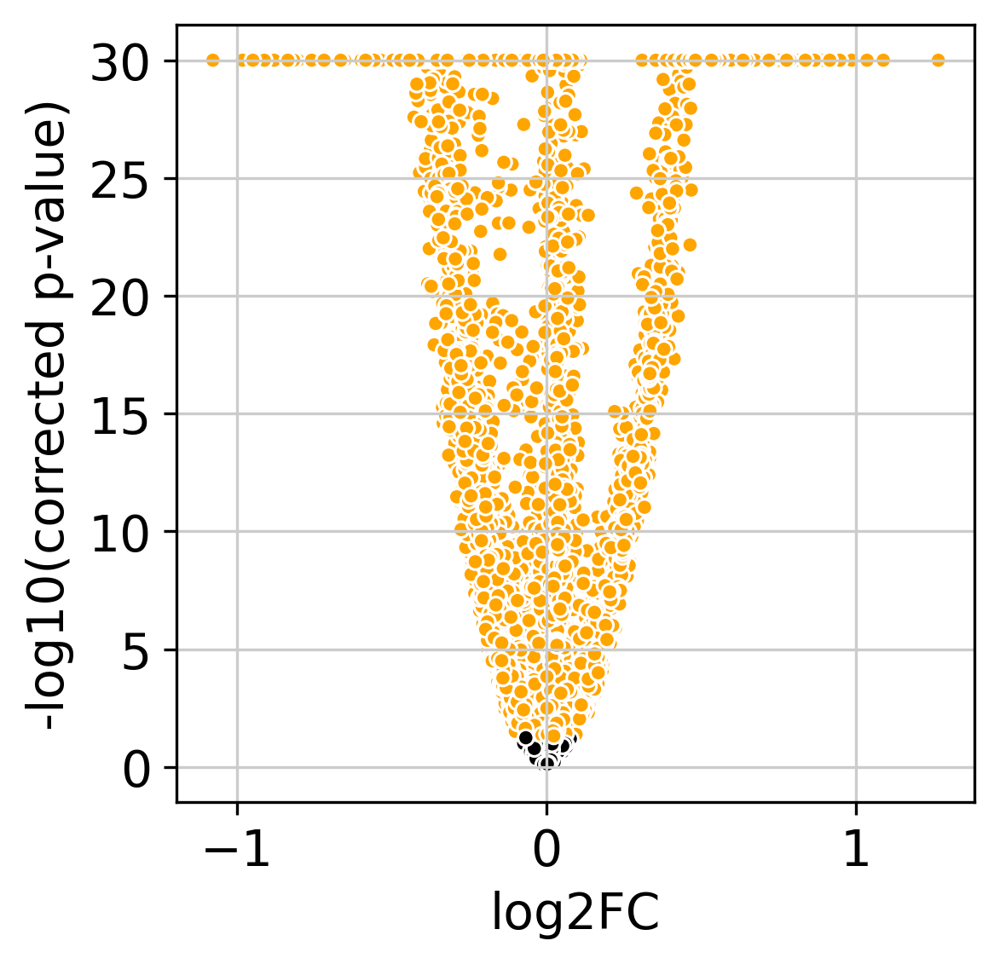

In [63]:
test_tt_early_mono.plot_volcano(save='Mono_Early_Diffxpy')

In [64]:
data_test_tt_early_mono={'gene':test_tt_early_mono.gene_ids,'log2FC':test_tt_early_mono.log2_fold_change(),'pval':test_tt_early_mono.pval,
              'Pval_clean':pow(10,test_tt_early_mono.log10_pval_clean()),'qval':test_tt_early_mono.qval}

In [65]:
mono_early_DE = pd.DataFrame(data=data_test_tt_early_mono)

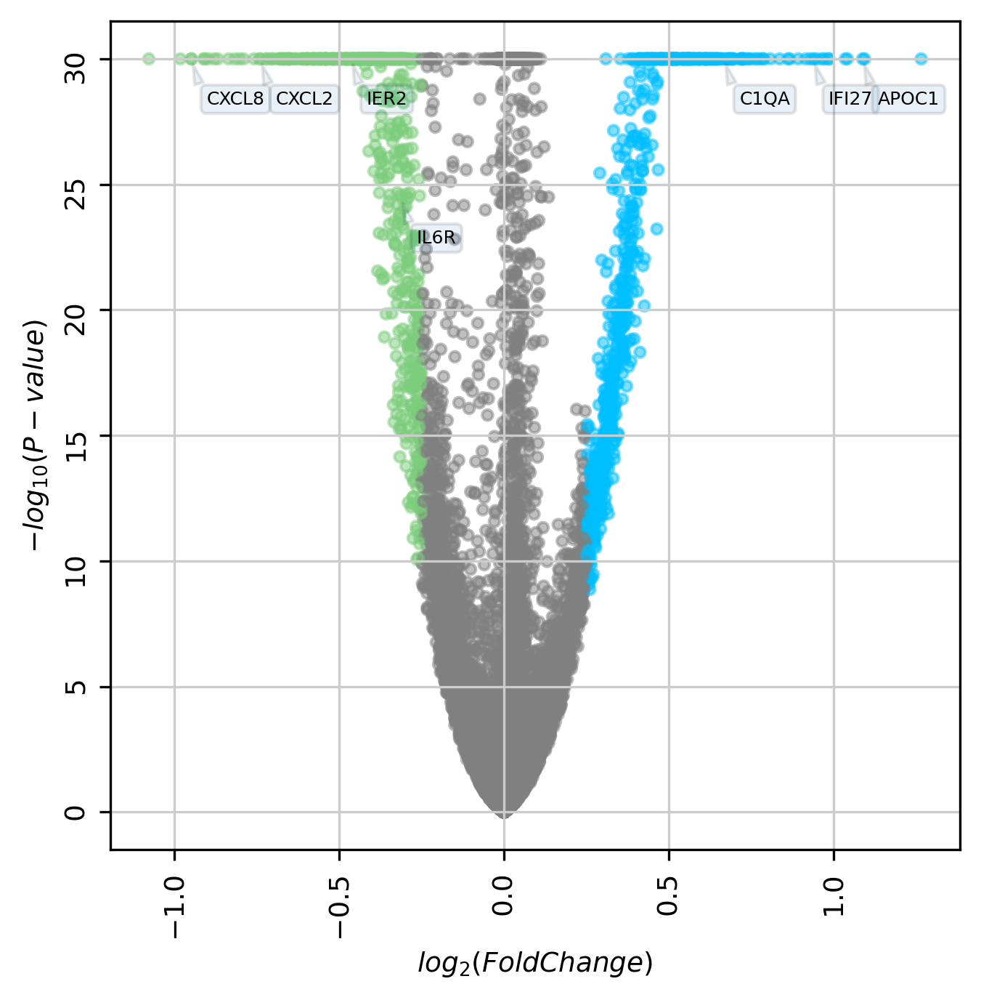

In [79]:
visuz.gene_exp.volcano(df=mono_early_DE, lfc='log2FC', pv='Pval_clean',lfc_thr=(0.25,0.25), color=('#00BFFF','grey','#7CCD7C'),valpha=0.5, dotsize=12,geneid='gene',genenames=('CXCL8','APOC1','C1QA','IL6R','CXCL2','IER2','IFI27'), gstyle=2, show=True)

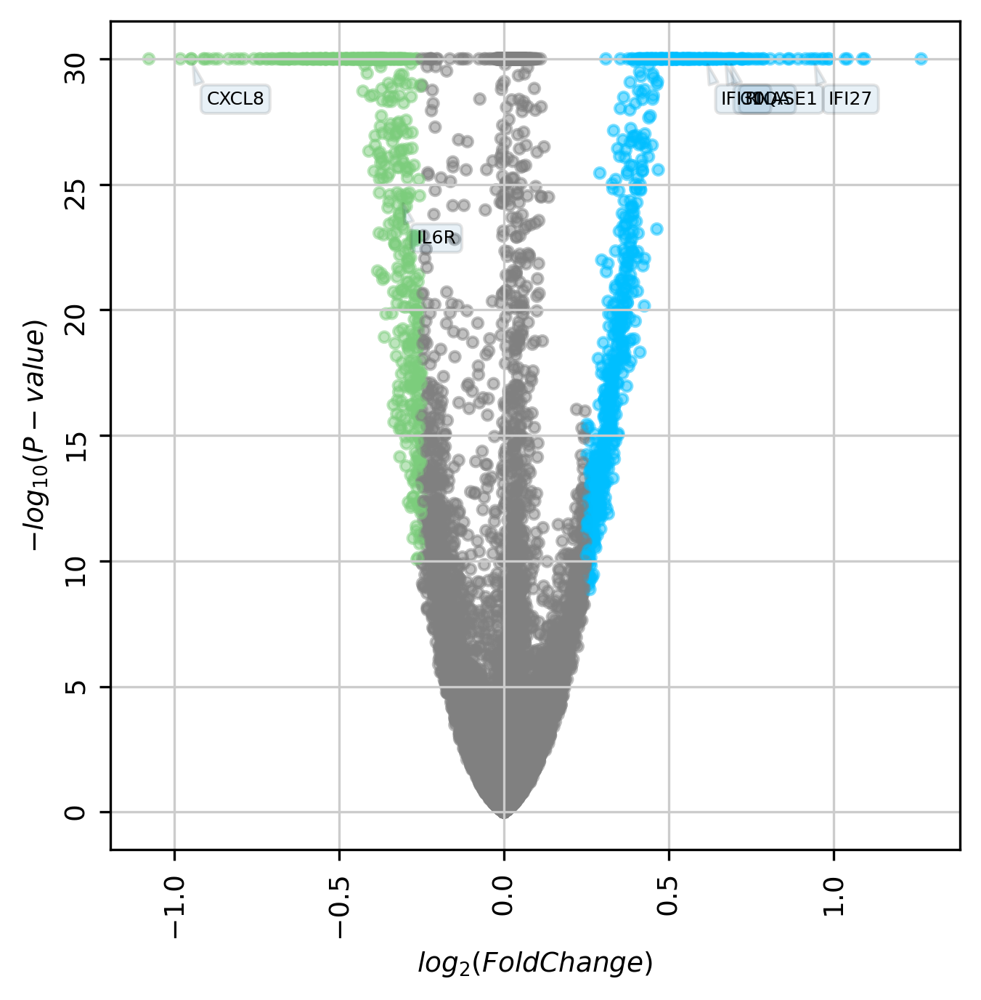

In [74]:
visuz.gene_exp.volcano(df=mono_early_DE, lfc='log2FC', pv='Pval_clean',lfc_thr=(0.25,0.25), color=('#00BFFF','grey','#7CCD7C'),valpha=0.5, dotsize=12,geneid='gene',genenames=('C1QA','IL6R','CXCL8','IFI27','IFI30','RNASE1'), gstyle=2, show=True)

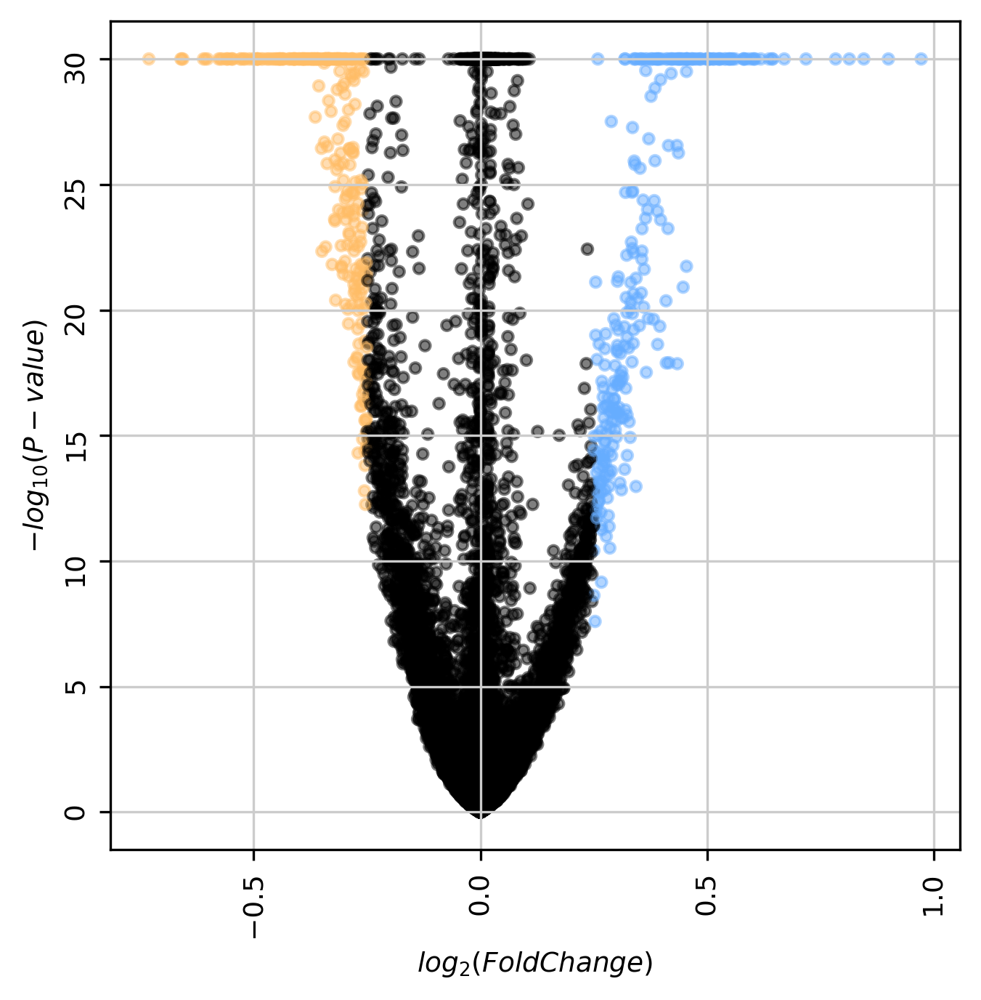

In [49]:
visuz.gene_exp.volcano(df=mono_early_DE, lfc='log2FC', pv='Pval_clean',lfc_thr=(0.25,0.25), color=('#66adff','black','#ffbd66'),valpha=0.5, dotsize=12, show=True)

In [83]:

mono_early_DE.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/mono_early_DE_genes_022421.csv')

# Late VAP Mono DE Genes

In [139]:
#Test for differences across all cell types

test_tt_late_mono = de.test.t_test(
    data=adata_late_mono,
    grouping="VAP",is_logged=True,is_sig_zerovar =False
    
)

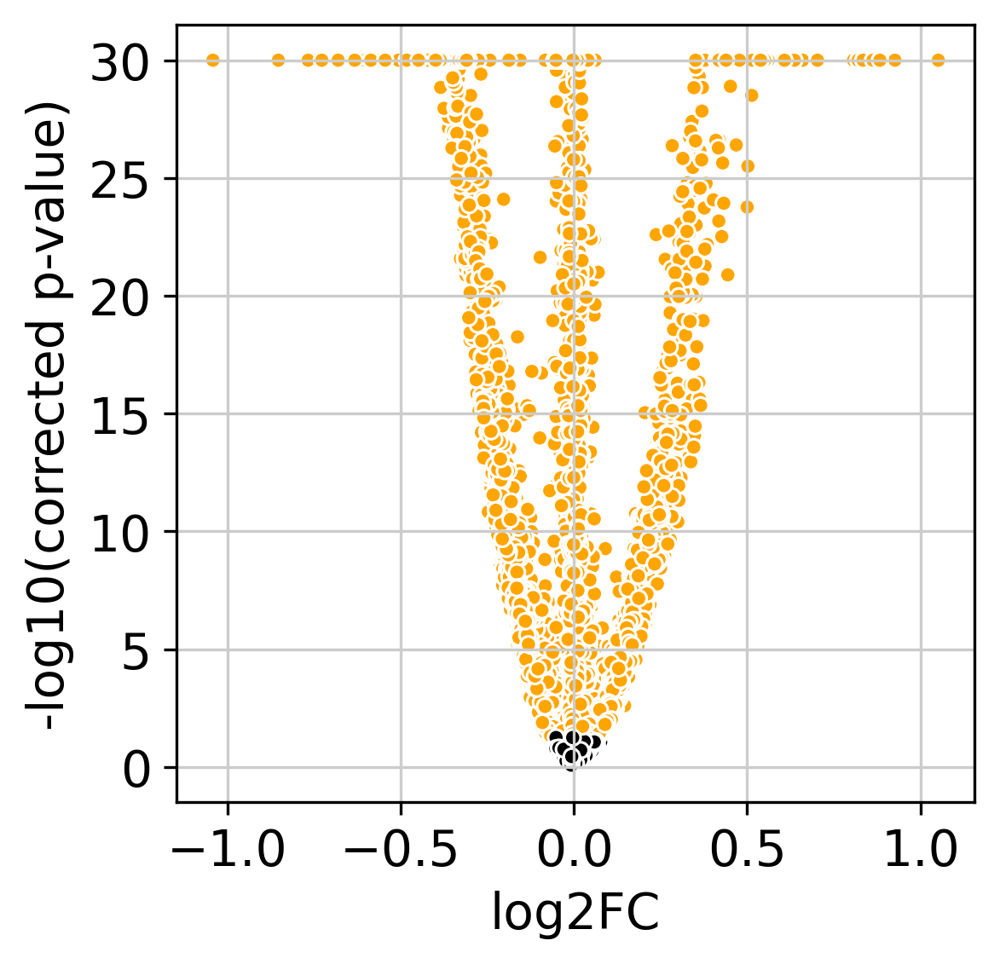

In [140]:
test_tt_late_mono.plot_volcano()

In [141]:
data_test_tt_late_mono={'gene':test_tt_late_mono.gene_ids,'log2FC':test_tt_late_mono.log2_fold_change(),'pval':test_tt_late_mono.pval,
              'Pval_clean':pow(10,test_tt_late_mono.log10_pval_clean()),'qval':test_tt_late_mono.qval}

In [142]:
mono_late_DE = pd.DataFrame(data=data_test_tt_late_mono)


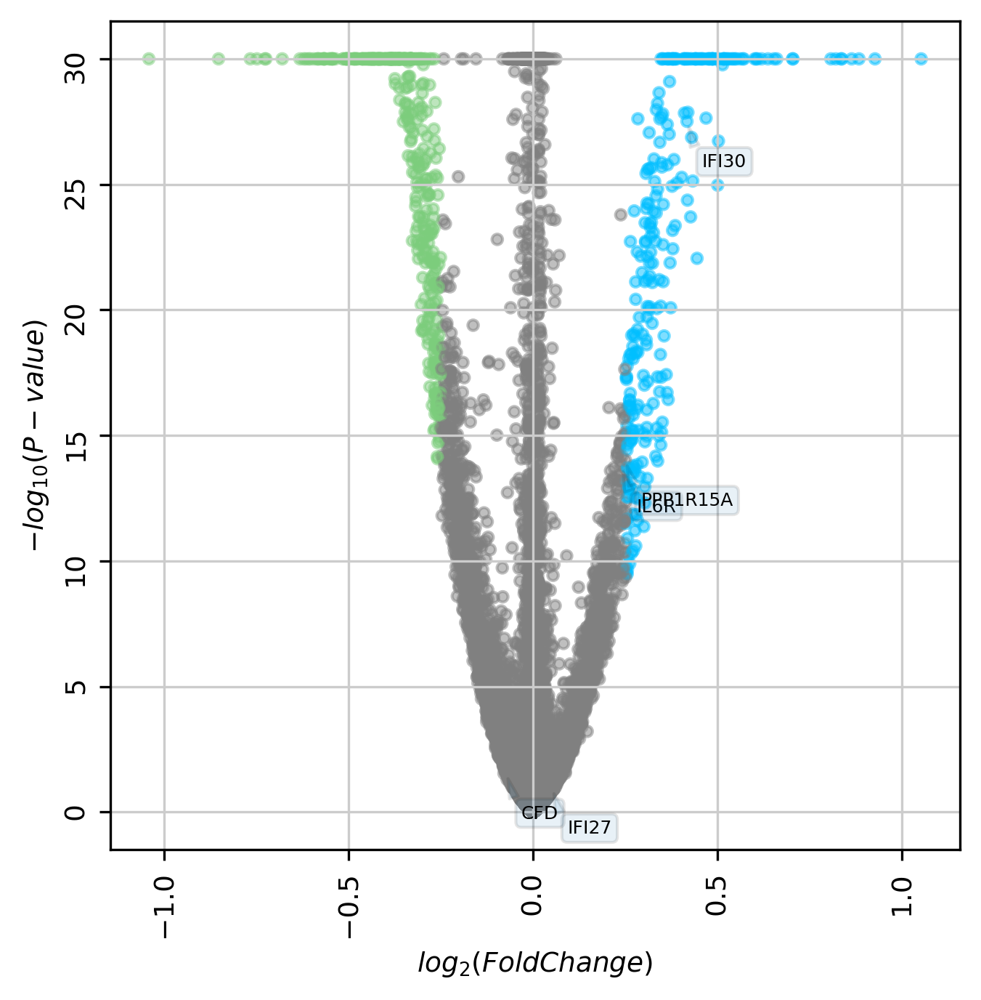

In [143]:
visuz.gene_exp.volcano(df=mono_late_DE, lfc='log2FC', pv='Pval_clean',lfc_thr=(0.25,0.25), color=('#00BFFF','grey','#7CCD7C'),valpha=0.5, dotsize=12,geneid='gene',genenames=('CFD','IL6R','PPP1R15A','IFI27','IFI30'), gstyle=2,show=True)

In [ ]:
mono_late_DE.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/mono_late_DE_genes_122220.csv')

# Early VAP T cells DE Genes

In [85]:
#Test for differences across all cell types

test_tt_early_tcells = de.test.t_test(
    data=adata_early_noControl_vap_tcells,
    grouping="VAP",is_logged=True,is_sig_zerovar =False
    
)

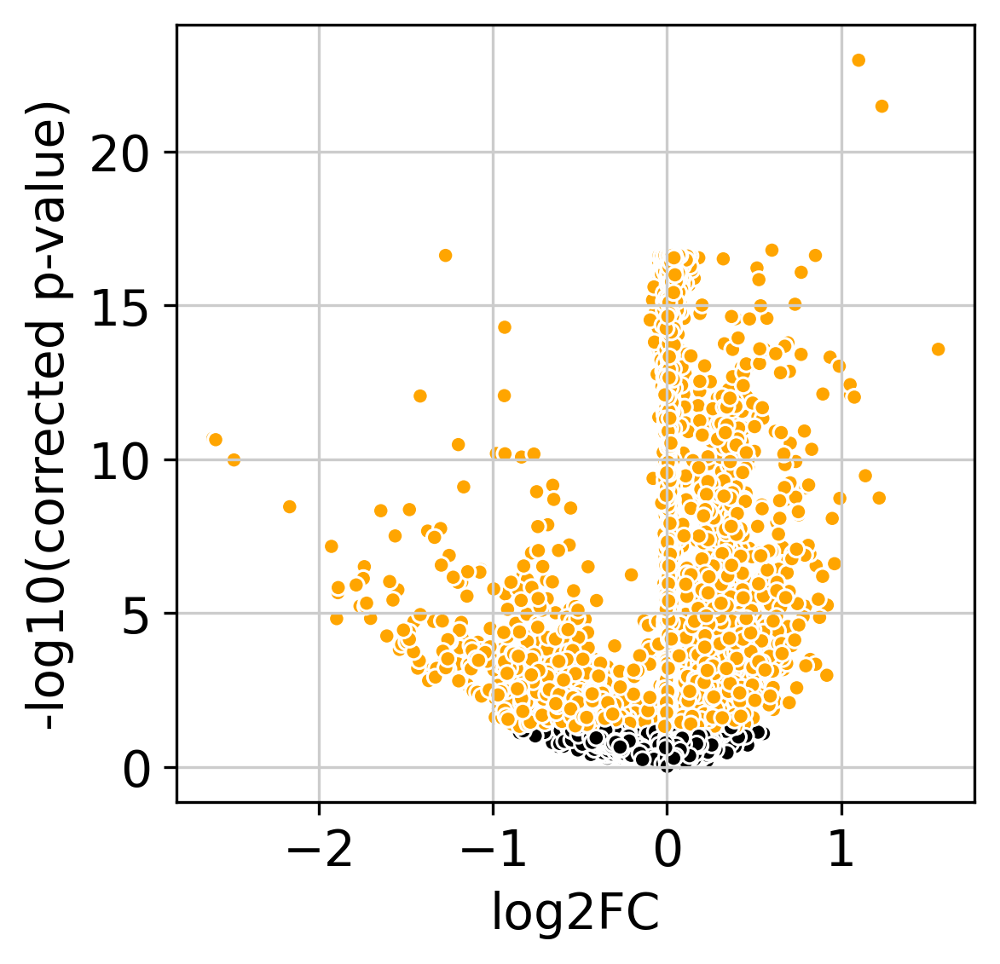

In [86]:
test_tt_early_tcells.plot_volcano(save='Tcells_Early_Diffxpy_022421')

In [87]:
data_test_tt_early_tcells={'gene':test_tt_early_tcells.gene_ids,'log2FC':test_tt_early_tcells.log2_fold_change(),'pval':test_tt_early_tcells.pval,
              'Pval_clean':pow(10,test_tt_early_tcells.log10_pval_clean()),'qval':test_tt_early_tcells.qval}

In [88]:
tcells_early_DE = pd.DataFrame(data=data_test_tt_early_tcells)

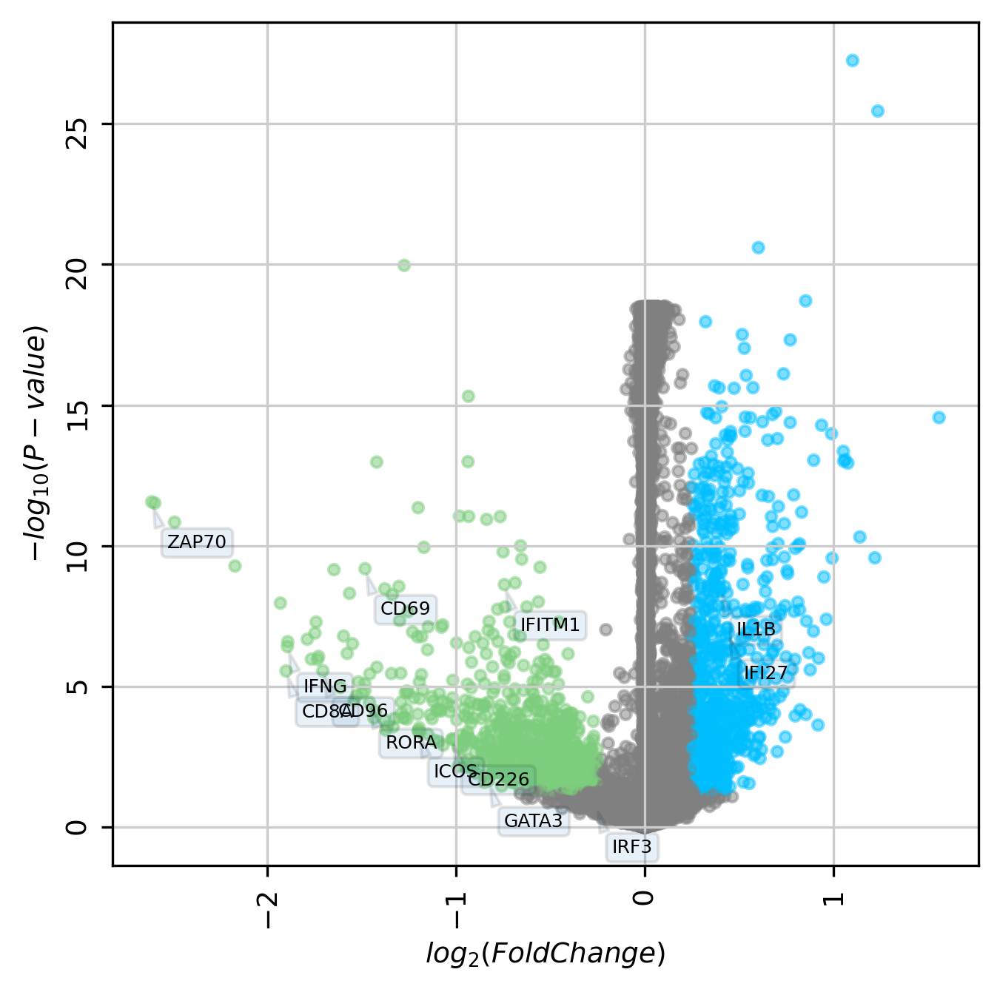

In [92]:
visuz.gene_exp.volcano(df=tcells_early_DE, lfc='log2FC', pv='Pval_clean',lfc_thr=(0.25,0.25), color=('#00BFFF','grey','#7CCD7C'),valpha=0.5, dotsize=12,geneid='gene',genenames=('CD8A','CD96','IFNG','CD69','ZAP70','CD226','ICOS','IFITM1','GATA3','RORA','IRF3','IFI27','IL1B'), gstyle=2, show=True)

In [148]:
visuz.gene_exp.volcano(df=tcells_early_DE, lfc='log2FC', pv='Pval_clean',lfc_thr=(0.25,0.25), color=('#00BFFF','grey','#7CCD7C'),valpha=0.5, dotsize=12,geneid='gene',genenames=('IL21R','ITGA4','LAG3','NKG7','KLRG1','CD101','IL1B','FTH1','IGLV3-19','TRBV20-1','IFITM1','IFNG','IFITM2','IFITM3','IFI30'), gstyle=2,figname='Tcells_early_IFN_names2',figtype='pdf')

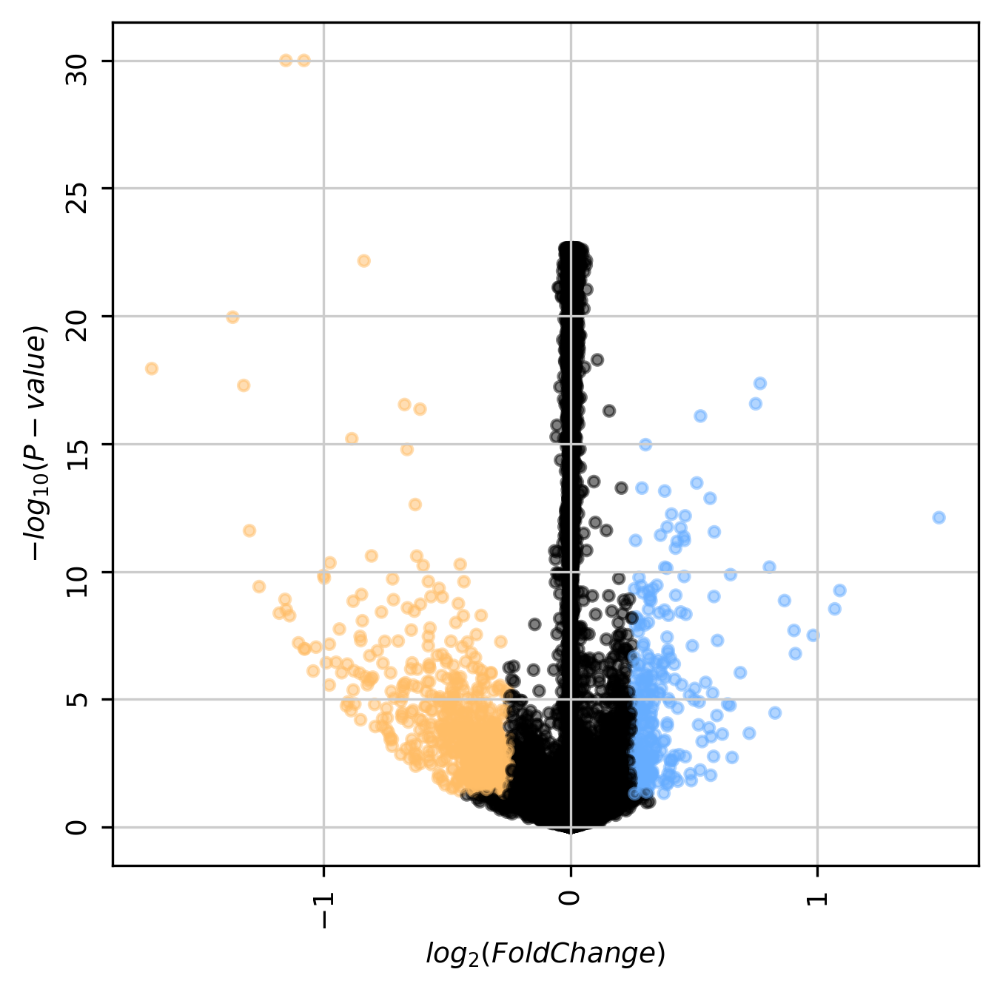

In [82]:
visuz.gene_exp.volcano(df=tcells_early_DE, lfc='log2FC', pv='Pval_clean',lfc_thr=(0.25,0.25), color=('#66adff','black','#ffbd66'),valpha=0.5, dotsize=12, figname='Tcells_Early_021221')

In [108]:
visuz.gene_exp.volcano(df=tcells_early_DE, lfc='log2FC', pv='Pval_clean',lfc_thr=(0.3,0.3), color=('#00BFFF','grey','#7CCD7C'),valpha=0.5, dotsize=12, figname='Tcells_Early_021621', figtype='pdf')

In [91]:

tcells_early_DE.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/tcells_early_DE_genes_022421.csv')

# Late VAP T cells DE Genes

In [57]:
#Test for differences across all cell types

test_tt_late_tcells = de.test.t_test(
    data=adata_late_tcells,
    grouping="VAP",is_logged=True,is_sig_zerovar =False
    
)

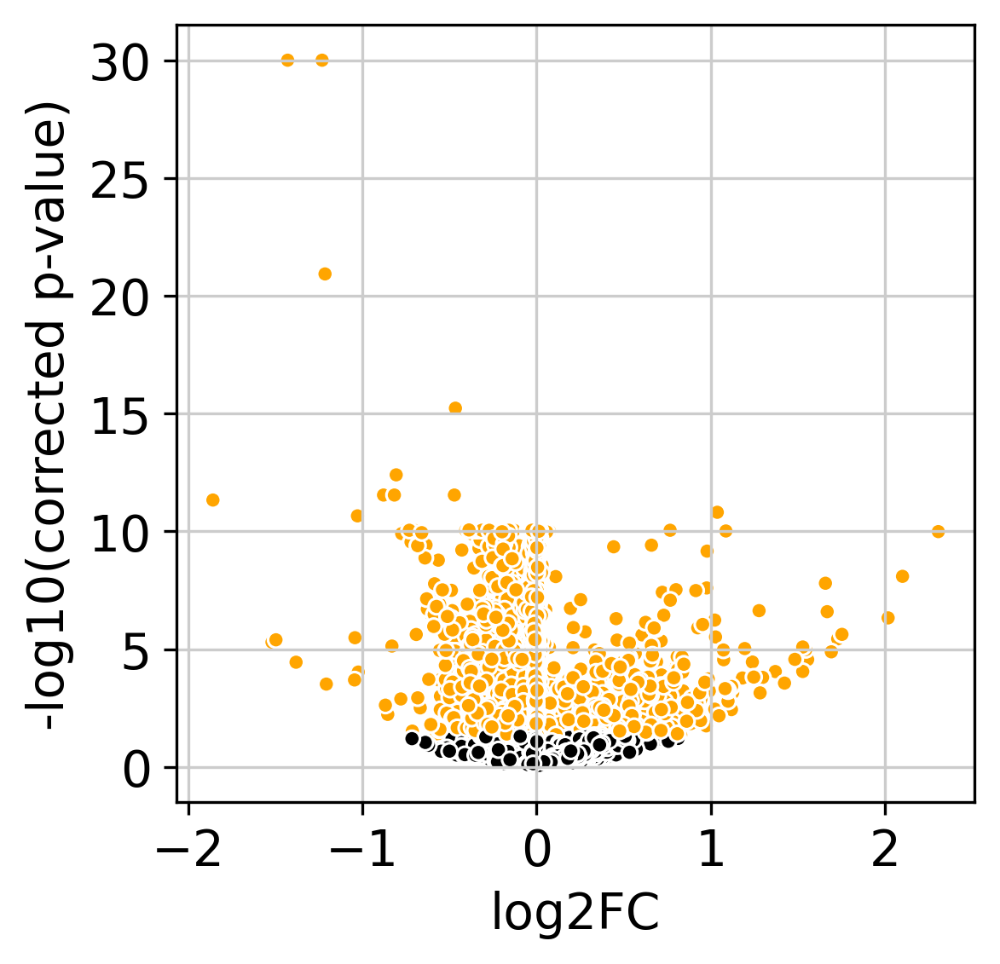

In [58]:
test_tt_late_tcells.plot_volcano()

In [59]:
data_test_tt_late_tcells={'gene':test_tt_late_tcells.gene_ids,'log2FC':test_tt_late_tcells.log2_fold_change(),'pval':test_tt_late_tcells.pval,
              'Pval_clean':pow(10,test_tt_late_tcells.log10_pval_clean()),'qval':test_tt_late_tcells.qval}

In [60]:
tcells_late_DE = pd.DataFrame(data=data_test_tt_late_tcells)
tcells_late_DE.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/tcells_late_DE_genes.csv')

# Longitudinal Early VAP vs Late VAP

In [28]:
#Test for differences across all cell types

test_tt_long_tcells = de.test.t_test(
    data=adata_long_tcells,
    grouping="Timepoint",is_logged=True,is_sig_zerovar =False
    
)

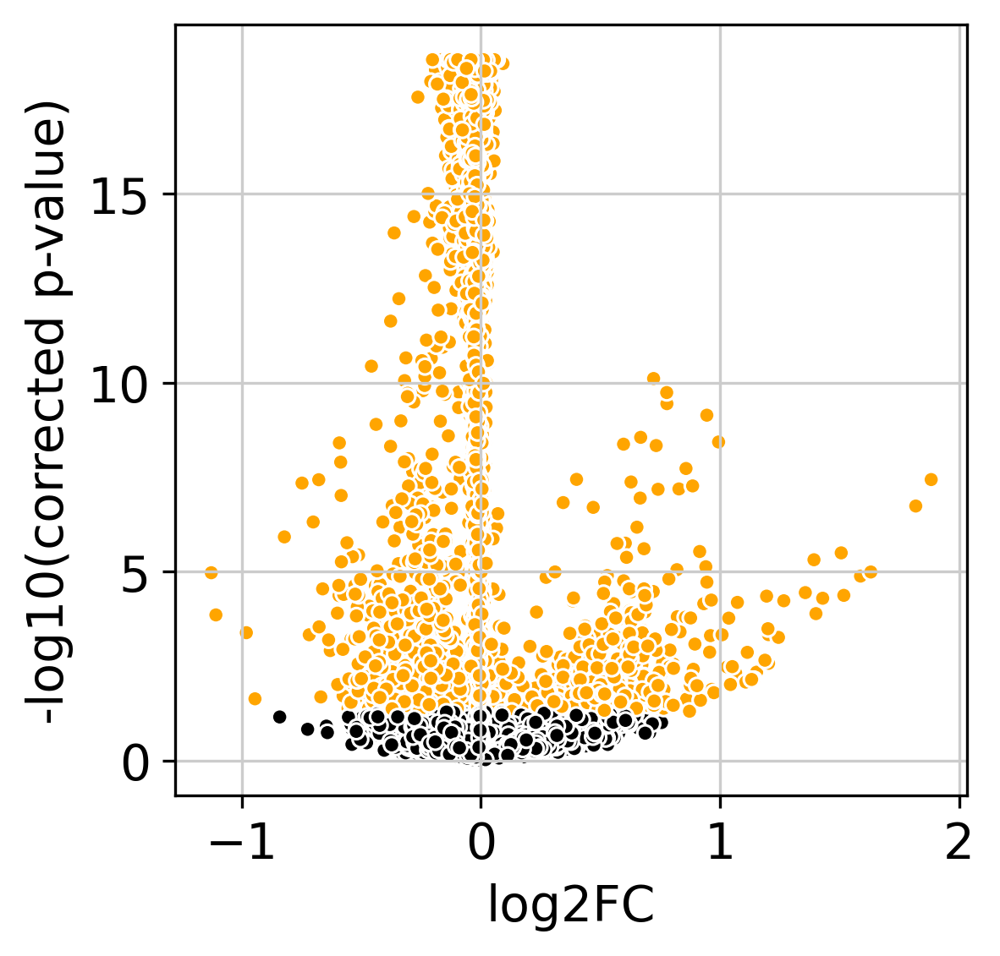

In [29]:
test_tt_long_tcells.plot_volcano()

In [30]:
data_test_tt_long_tcells={'gene':test_tt_long_tcells.gene_ids,'log2FC':test_tt_long_tcells.log2_fold_change(),'pval':test_tt_long_tcells.pval,
              'Pval_clean':pow(10,test_tt_long_tcells.log10_pval_clean()),'qval':test_tt_long_tcells.qval}

In [31]:
tcells_long_DE = pd.DataFrame(data=data_test_tt_long_tcells)
tcells_long_DE.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/tcells_long_DE_genes.csv')

In [32]:
#Test for differences across all cell types

test_tt_long_neut = de.test.t_test(
    data=adata_long_neut,
    grouping="Timepoint",is_logged=True,is_sig_zerovar =False
    
)

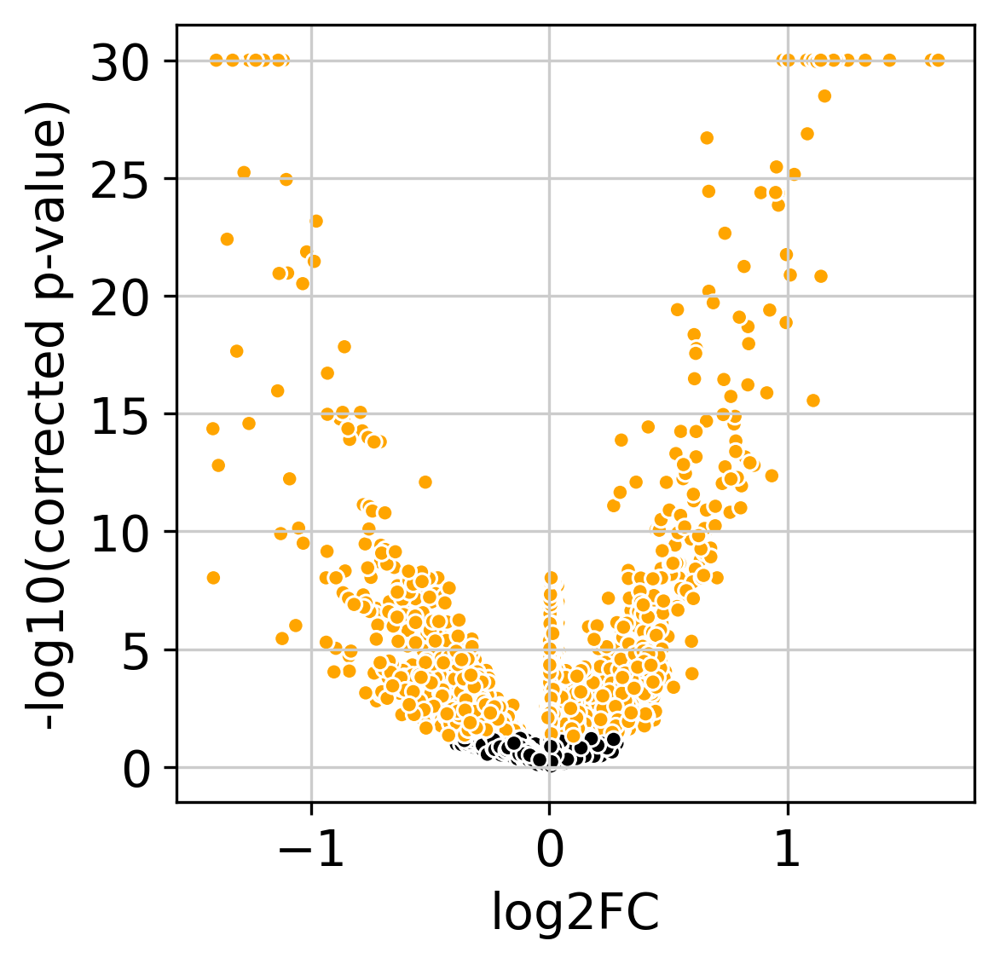

In [33]:
test_tt_long_neut.plot_volcano()

In [35]:
data_test_tt_long_neut={'gene':test_tt_long_neut.gene_ids,'log2FC':test_tt_long_neut.log2_fold_change(),'pval':test_tt_long_neut.pval,
              'Pval_clean':pow(10,test_tt_long_neut.log10_pval_clean()),'qval':test_tt_long_neut.qval}

In [36]:
neut_long_DE = pd.DataFrame(data=data_test_tt_long_neut)
neut_long_DE.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/neut_long_DE_genes.csv')

In [37]:
#Test for differences across all cell types

test_tt_long_mono = de.test.t_test(
    data=adata_long_mono,
    grouping="Timepoint",is_logged=True,is_sig_zerovar =False
    
)

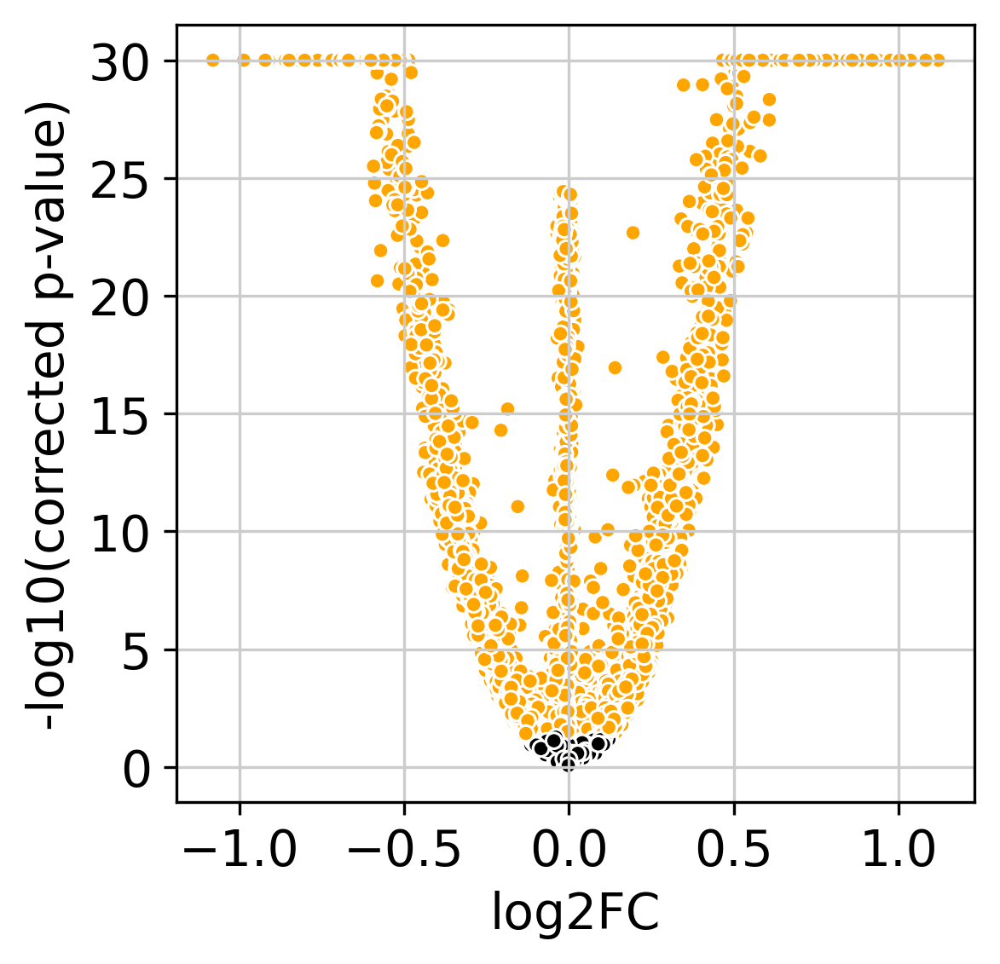

In [38]:
test_tt_long_mono.plot_volcano()

In [39]:
data_test_tt_long_mono={'gene':test_tt_long_mono.gene_ids,'log2FC':test_tt_long_mono.log2_fold_change(),'pval':test_tt_long_mono.pval,
              'Pval_clean':pow(10,test_tt_long_mono.log10_pval_clean()),'qval':test_tt_long_mono.qval}

In [41]:
mono_long_DE = pd.DataFrame(data=data_test_tt_long_mono)
mono_long_DE.to_csv('/mnt/ibm_lg/ashleyb/COVID19_Data/COMET/Analysis/Secondary_Bacterial_Infection/mono_long_DE_genes.csv')

In [33]:
sc.tl.embedding_density(adata_merge_long, groupby='Timepoint', key_added='timepoint_density_umap')

computing density on 'umap'
--> added
    'timepoint_density_umap', densities (adata.obs)
    'timepoint_density_umap_params', parameter (adata.uns)


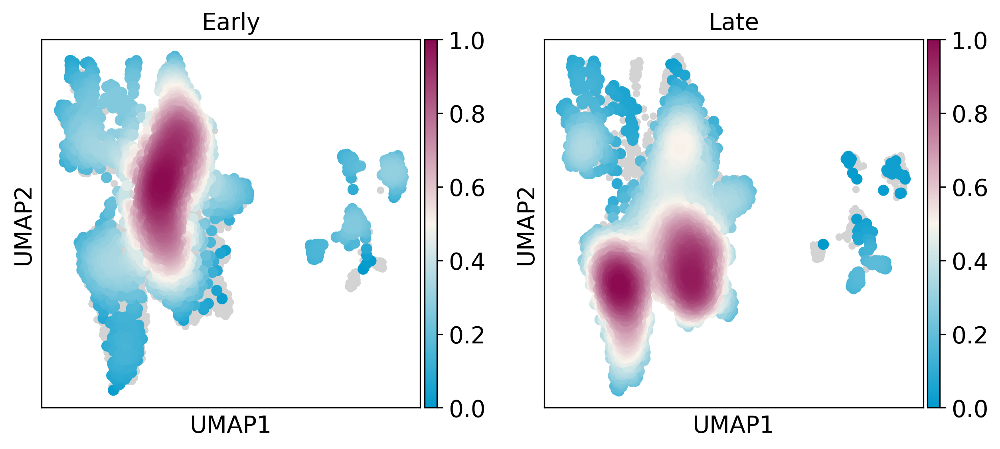

In [34]:
sc.pl.embedding_density(adata_merge_long, key='timepoint_density_umap', color_map=cmap)

# Cell Abundance

In [36]:
cell_type_title = 'annotated'

cell_df = pd.DataFrame()
for cell_type in set(adata_merge_early.obs[cell_type_title]):
    cell_n_list = []
    for patient_id in set(adata_merge_early.obs['Identity']):
        input_adata = adata_merge_early[adata_merge_early.obs[cell_type_title] == cell_type]
        input_adata = input_adata[input_adata.obs['Identity'] == patient_id]
        cell_n_list.append(len(input_adata))
    
    cell_df[cell_type] = cell_n_list
    
cell_df.index = set(adata_merge_early.obs['Identity'])
cell_df

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


,Secretory,Mono/Mac,B cell,Cilliated,T cells/Natural Killer,Neutrophil
COMET_1158_CD45_Day4,18,350,9,4,45,2
COMET_1115_CD45_Day6,4,1121,16,1,110,141
COMET_1271_CD45_Day12,21,765,43,9,17,1034
COMET_1047_CD45_Day2,4,344,8,0,67,261
COMET_1290_CD45_Day7,39,1183,2,7,30,1142
COMET_1002_CD45_Day0,171,1491,6,224,264,435
COMET_1161_CD45_Day3,15,251,12,4,85,2
COMET_1172_CD45_Day5,17,784,8,4,48,152
COMET_1320_CD45_Day13,10,1717,6,3,164,263
COMET_1001_CD45_Day0,175,544,6,249,158,129


In [37]:
cell_type_title = 'annotated'

cell_df_late = pd.DataFrame()
for cell_type in set(adata_merge_late.obs[cell_type_title]):
    cell_n_list = []
    for patient_id in set(adata_merge_late.obs['Identity']):
        input_adata = adata_merge_late[adata_merge_late.obs[cell_type_title] == cell_type]
        input_adata = input_adata[input_adata.obs['Identity'] == patient_id]
        cell_n_list.append(len(input_adata))
    
    cell_df_late[cell_type] = cell_n_list
    
cell_df_late.index = set(adata_merge_late.obs['Identity'])
cell_df_late

/home/ashleyb/.local/lib/python3.6/site-packages/anndata/_core/anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


,Secretory,Mono/Mac,B cell/Dendritic,Cilliated,T cells/Natural Killer,Neutrophil
COMET_1001_CD45_Day0,173,554,27,250,160,96
COMET_1271_CD45_Day16,6,370,8,2,10,0
COMET_1158_CD45_Day4,19,343,19,3,44,0
COMET_1357_CD45_Day7,109,890,8,4,38,539
COMET_1115_CD45_Day6,4,1103,37,0,112,126
COMET_1072_CD45_Day10,9,4502,53,1,156,282
COMET_1290_CD45_Day7,40,1180,27,6,28,1112
COMET_1002_CD45_Day0,170,1526,31,226,268,370
COMET_1264_CD45_Day14,12,763,6,1,11,2946
COMET_1154_CD45_Day13,22,612,33,4,212,37
